In [ ]:
# 1- single run each sample :
# code and data: /scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/single_run

In [ ]:
# 3- CONGAS
# code and data : /scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/single_run

In [ ]:
# 4- GEX data Aggregation

#code and data:
# /scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/row_version_Gex
# /scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED

# DE GEX and HOTSPOT: /home/fatemeh.nasrabadi/ROVIGO_congas/final/gex_aggregation/THESIS GEX DE seq and HOT spot on all tumors




#tumor:
#row

#FINALIZED

In [ ]:
# UMAP, Signature analysis --> /home/fatemeh.nasrabadi/ROVIGO_congas/final/PLOT2_finalized_gex_visualization RUN2
#PTPRZ1

# code and data

In [ ]:
# DEA, pathway enrichment, HOTSPOT  --> /home/fatemeh.nasrabadi/ROVIGO_congas/final/gex_aggregation/DE seq and HOT spot on all tumors

#code and data


In [ ]:
import scanpy as sc

import muon as mu

from muon import atac as ac
from muon import prot as pt

import scipy
import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns

import pandas as pd

In [ ]:
def write_dataset(data, path, sep='\t', header=True, index=True, compression=None):
    """
    See pandas.to_csv documentation - this is just a wrapper
    :param data: data to save
    :param path: str or Path object, path to save
    :param sep:
    :param header:
    :param index:
    :param compression:
    :return:
    """
    from pathlib import Path

    if isinstance(path, str):
        path = Path(path)

    output_dir = path.parents[0]
    output_dir.mkdir(parents=True, exist_ok=True)

    return data.to_csv(
        path, sep=sep, header=header, index=index, compression=compression
    )

In [ ]:
tumor= sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_row_FINAL_afteratac8121.h5ad")

In [ ]:
tumor

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source'

In [ ]:
!ls /scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/

10Samples_agg_ATAC_tumor_rowmatrix.h5ad  DGE
10Samples_agg_FINALIZED.h5ad		 Plots_all_tumor.ipynb
10Samples_agg_gex_raw.h5ad		 Tumor_after_check_atac.h5ad
10Samples_agg_raw_filtered.h5ad		 Tumor_row_FINAL_afteratac8121.h5ad
allPLOT_Umap.h5ad			 Tumor_Umap_harmoney8121.h5ad


In [ ]:
all_data = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/10Samples_agg_FINALIZED.h5ad")

In [ ]:
##colors

In [ ]:
cell_type_colors = {
    "Oligodendrocytes":"#a8db96", #"#c9e5b9",  # light green
    "Tumor cells": "#1b519b",      # blue
    "Microglial cells": "#e996a7",        # pink
    "Excitatory neurons": "#8566a9",  # green
    "Inhibitory neurons": "#b67b88",  # orange-yellow
    "OPCs": "#aed8ea",              # pale blue
    "Astrocytes": "#b22725",        # red
    "T cells": "#f07e27"           # orange
}


In [ ]:
patient_colors = {
    "BTROHT03": "#96e6b3",  # Mint Green (replacement for white)
    "BTROHT04": "#235789",  # Steel Blue
    "BTROHT06": "#ffc126",  # Golden Yellow
    "BTROHT01": "#c1292e",  # Warm Red
    "BTROHT02": "#161925"   # Deep Navy
}


site_colors = {
    "Core": "#ef6c7c",         # Coral Pink
    "Peri": "#77b5d9"          # Sharper Sky Blue
}


In [ ]:
patient_zone_colors = {
    "BTROHT01_Core": "#003a7d",   # Dark Blue
    "BTROHT01_Peri": "#008dff",   # Med Blue
    "BTROHT02_Core": "#ff73b6",   # Pink
    "BTROHT02_Peri": "#122740",   # Purple
    "BTROHT03_Core": "#4ecb8d",   # Green
    "BTROHT03_Peri": "#ff9d3a",   # Orange
    "BTROHT04_Core": "#9d2c00",
    "BTROHT04_Peri": "#d83034",   # Red
    "BTROHT06_Core": "#a63cff",   # Extra 1 (Sharp Violet)
    "BTROHT06_Peri": "#00c2b8",   # Extra 2 (Teal)
}


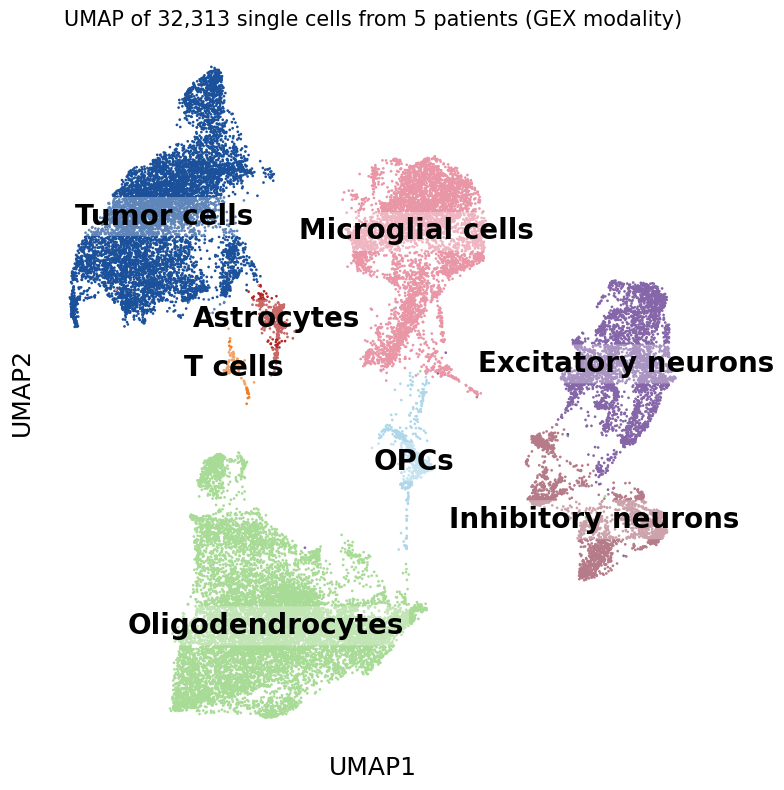

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# Ensure the annotation is categorical
all_data.obs["Bigannotation"] = all_data.obs["Bigannotation"].astype("category")

# Apply custom colors
all_data.uns["Bigannotation_colors"] = [
    cell_type_colors[ct] for ct in all_data.obs["Bigannotation"].cat.categories
]

# Plot and capture figure
fig = sc.pl.umap(
    all_data,
    color='Bigannotation',
    size=15,
    frameon=True,
    return_fig=True
)

# Resize figure
fig.set_size_inches(8, 8)

# Access Axes
ax = fig.axes[0]

# Set axis labels
ax.set_xlabel("UMAP1", fontsize=18)
ax.set_ylabel("UMAP2", fontsize=18)

# ✅ Add a title for the full UMAP
ax.set_title("UMAP of 32,313 single cells from 5 patients (GEX modality)", fontsize=15)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

# ❌ Remove default legend
if ax.get_legend() is not None:
    ax.get_legend().remove()

# ✅ Add labels directly on the UMAP
# Get coordinates
umap_df = all_data.obsm["X_umap"]
labels = all_data.obs["Bigannotation"]

# Convert to DataFrame for easier handling
df = pd.DataFrame(umap_df, columns=["UMAP1", "UMAP2"])
df["label"] = labels.values

# Compute median coordinates per label and place text
for label in df["label"].unique():
    x = df.loc[df["label"] == label, "UMAP1"].median()
    y = df.loc[df["label"] == label, "UMAP2"].median()
    ax.text(
        x, y, label,
        fontsize=20,
        weight='bold',
        ha='center',
        va='center',
        bbox=dict(facecolor='white', alpha=0.3, edgecolor='none', boxstyle='round,pad=0.2')
    )

plt.tight_layout()
plt.show()


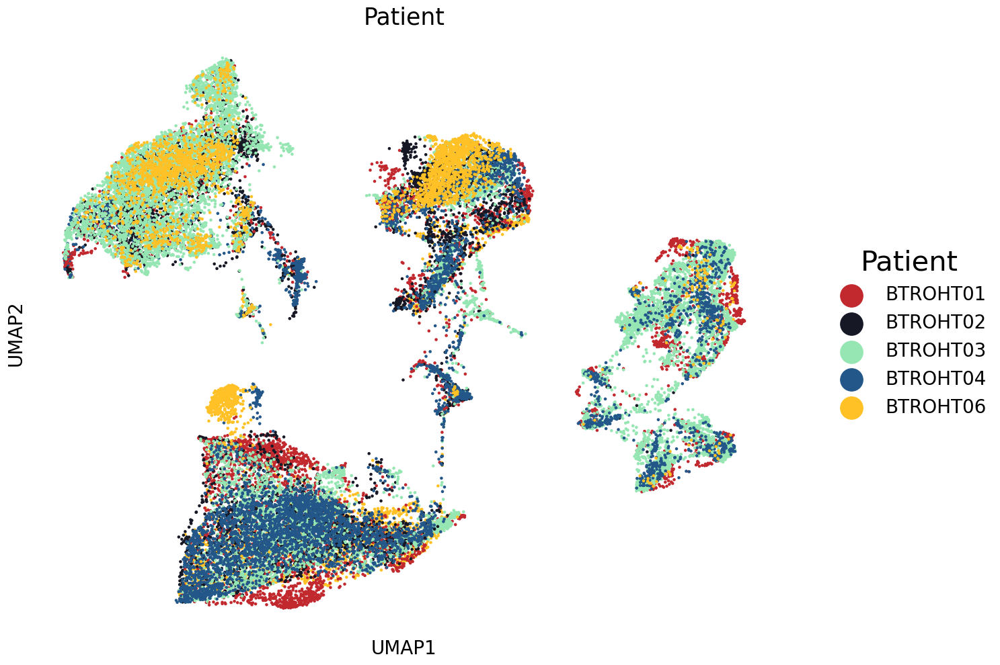

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# Ensure the patient column is categorical
all_data.obs["patient"] = all_data.obs["patient"].astype("category")

# Apply custom patient colors
all_data.uns["patient_colors"] = [
    patient_colors[pt] for pt in all_data.obs["patient"].cat.categories
]

# Plot and capture figure
fig = sc.pl.umap(
    all_data,
    color='patient',
    size=43,
    frameon=True,
    return_fig=True,
    legend_loc='right margin'
)

# Resize figure
fig.set_size_inches(15, 10)

# Access Axes
ax = fig.axes[0]

# Set axis labels and title
ax.set_xlabel("UMAP1", fontsize=20)
ax.set_ylabel("UMAP2", fontsize=20)
ax.set_title("Patient", fontsize=25)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

# ✅ Adjust legend font size & dot size
legend = ax.get_legend()
if legend is not None:
    # Increase font size
    for text in legend.get_texts():
        text.set_fontsize(10)

    # Increase marker (dot) size by re-setting the legend
    handles, labels = ax.get_legend_handles_labels()
    legend.remove()  # remove old legend
    ax.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=20,
        title="Patient",
        title_fontsize=30,
        markerscale=4,  # ✅ Increase dot size
        frameon=False
    )

plt.tight_layout()
plt.show()


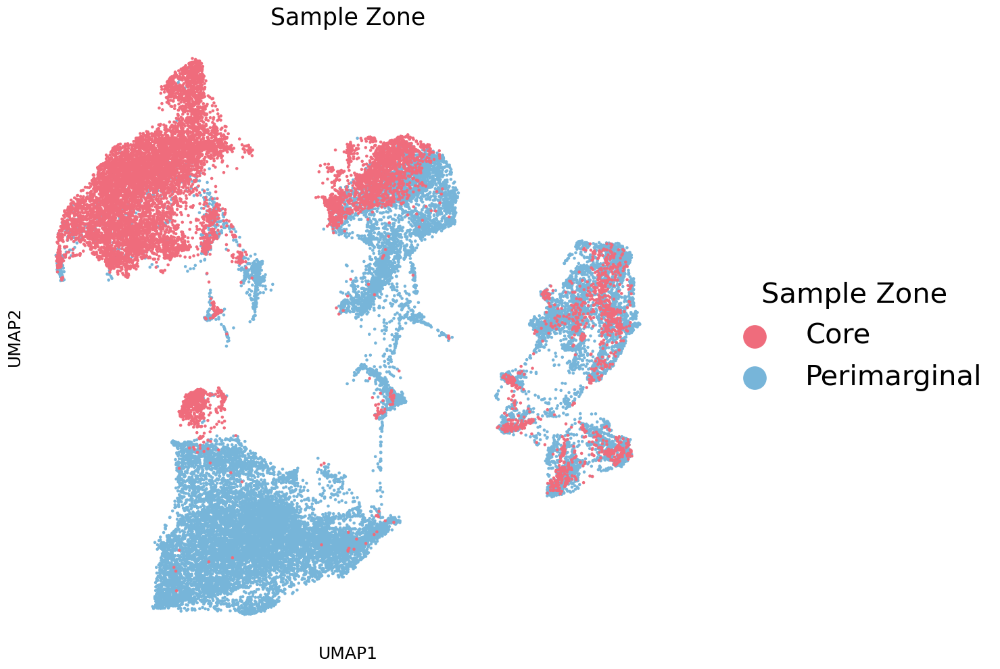

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# Ensure the 'site' column is categorical
all_data.obs["site"] = all_data.obs["site"].astype("category")

# Define custom colors
site_colors = {
    "Core": "#ef6c7c",         # Coral Pink
    "Peri": "#77b5d9"          # Sharper Sky Blue
}

# Apply the colors in the correct order
all_data.uns["site_colors"] = [site_colors[cat] for cat in all_data.obs["site"].cat.categories]

# Plot and capture the figure
fig = sc.pl.umap(
    all_data,
    color='site',
    size=43,
    frameon=True,
    return_fig=True,
    legend_loc='right margin'
)

# Resize the figure
fig.set_size_inches(15, 10)

# Access the Axes object
ax = fig.axes[0]

# Set axis labels
ax.set_xlabel("UMAP1", fontsize=18)
ax.set_ylabel("UMAP2", fontsize=18)
ax.set_title("Sample Zone", fontsize=25)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

# Adjust legend
legend = ax.get_legend()
if legend is not None:
    # Update label names
    handles, labels = ax.get_legend_handles_labels()
    label_map = {"Peri": "Perimarginal", "Core": "Core"}
    labels = [label_map.get(label, label) for label in labels]

    legend.remove()
    ax.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=30,
        title="Sample Zone",
        title_fontsize=30,
        markerscale=4,
        frameon=False
    )

plt.tight_layout()
plt.show()


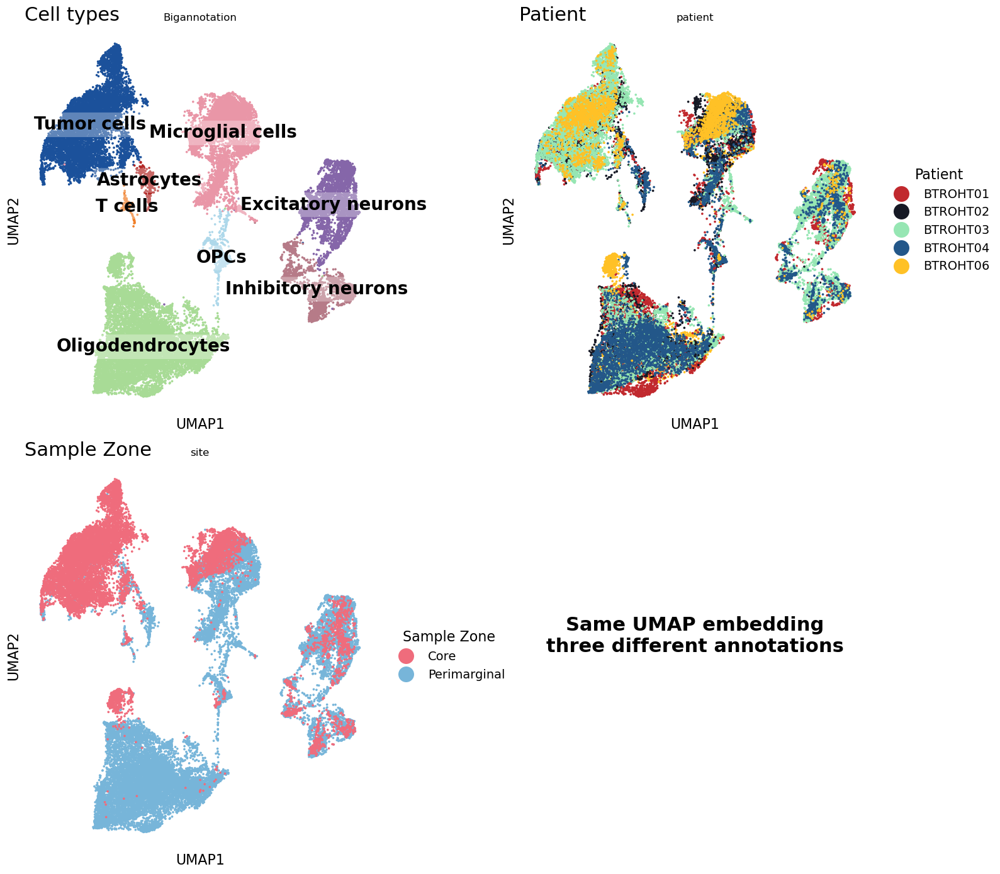

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

# -------- unified styling --------
POINT_SIZE   = 28
TITLE_SIZE   = 22
LABEL_SIZE   = 16
TICK_SIZE    = 12
LEGEND_SIZE  = 14
LEGEND_TITLE = 16
MARKERSCALE  = 3.0

def style_axis(ax, title=None):
    ax.set_xlabel("UMAP1", fontsize=LABEL_SIZE)
    ax.set_ylabel("UMAP2", fontsize=LABEL_SIZE)
    if title:
        ax.set_title(title, fontsize=TITLE_SIZE, pad=6, loc='left')  # ← title on left
    for s in ax.spines.values():
        s.set_visible(False)
    ax.tick_params(axis='both', which='major', labelsize=TICK_SIZE)


def add_categorical_legend(ax, cats, colors, *, title, rename_map=None):
    labels = [rename_map.get(c, c) if rename_map else c for c in cats]
    handles = [Line2D([0],[0], marker='o', linestyle='',
                      markerfacecolor=colors[i], markeredgecolor='none', markersize=6)
               for i in range(len(cats))]
    leg = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5),
                    fontsize=LEGEND_SIZE, frameon=False, title=title, markerscale=MARKERSCALE)
    if leg.get_title(): leg.get_title().set_fontsize(LEGEND_TITLE)

# -------- ensure categories & colors --------
all_data.obs["Bigannotation"] = all_data.obs["Bigannotation"].astype("category")
all_data.obs["patient"]       = all_data.obs["patient"].astype("category")
all_data.obs["site"]          = all_data.obs["site"].astype("category")

all_data.uns["Bigannotation_colors"] = [
    cell_type_colors[ct] for ct in all_data.obs["Bigannotation"].cat.categories
]
all_data.uns["patient_colors"] = [
    patient_colors[pt] for pt in all_data.obs["patient"].cat.categories
]
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
all_data.uns["site_colors"] = [site_colors[s] for s in all_data.obs["site"].cat.categories]

# -------- figure: 2×2 --------
fig, axs = plt.subplots(2, 2, figsize=(16, 14))
ax00, ax01, ax10, ax11 = axs.ravel()

# (0,0) Bigannotation — no legend; in-plot labels
sc.pl.umap(all_data, color="Bigannotation", size=POINT_SIZE, frameon=True,
           ax=ax00, show=False, legend_loc=None)
style_axis(ax00, "Cell types")
umap_df = pd.DataFrame(all_data.obsm["X_umap"], columns=["UMAP1","UMAP2"])
umap_df["label"] = all_data.obs["Bigannotation"].values
for lab in umap_df["label"].unique():
    x = umap_df.loc[umap_df["label"] == lab, "UMAP1"].median()
    y = umap_df.loc[umap_df["label"] == lab, "UMAP2"].median()
    ax00.text(x, y, str(lab), fontsize=LABEL_SIZE+4, weight='bold',
              ha='center', va='center',
              bbox=dict(facecolor='white', alpha=0.3, edgecolor='none', boxstyle='round,pad=0.2'))

# (0,1) Patient — keep legend/colors
sc.pl.umap(all_data, color="patient", size=POINT_SIZE, frameon=True,
           ax=ax01, show=False, legend_loc=None)
style_axis(ax01, "Patient")
add_categorical_legend(
    ax01,
    list(all_data.obs["patient"].cat.categories),
    list(all_data.uns["patient_colors"]),
    title="Patient"
)

# (1,0) Site — keep legend/colors; rename Peri→Perimarginal in legend only
sc.pl.umap(all_data, color="site", size=POINT_SIZE, frameon=True,
           ax=ax10, show=False, legend_loc=None)
style_axis(ax10, "Sample Zone")
add_categorical_legend(
    ax10,
    list(all_data.obs["site"].cat.categories),
    list(all_data.uns["site_colors"]),
    title="Sample Zone",
    rename_map={"Peri": "Perimarginal", "Core": "Core"}
)

# (1,1) Info panel
ax11.axis('off')
ax11.text(
    0.5, 0.55,
    "Same UMAP embedding\nthree different annotations",
    ha="center", va="center", fontsize=TITLE_SIZE, weight="bold"
)
ax11.text(
    0.5, 0.30,
    "Top-left: Bigannotation (labels on map)\n"
    "Top-right: Patient (legend preserved)\n"
    "Bottom-left: Sample Zone (legend preserved)",
    ha="center", va="center", fontsize=LABEL_SIZE
)

plt.tight_layout()
# Optional: save
# plt.savefig("umap_2x2_three_plus_info.png", dpi=300, bbox_inches="tight")
plt.show()


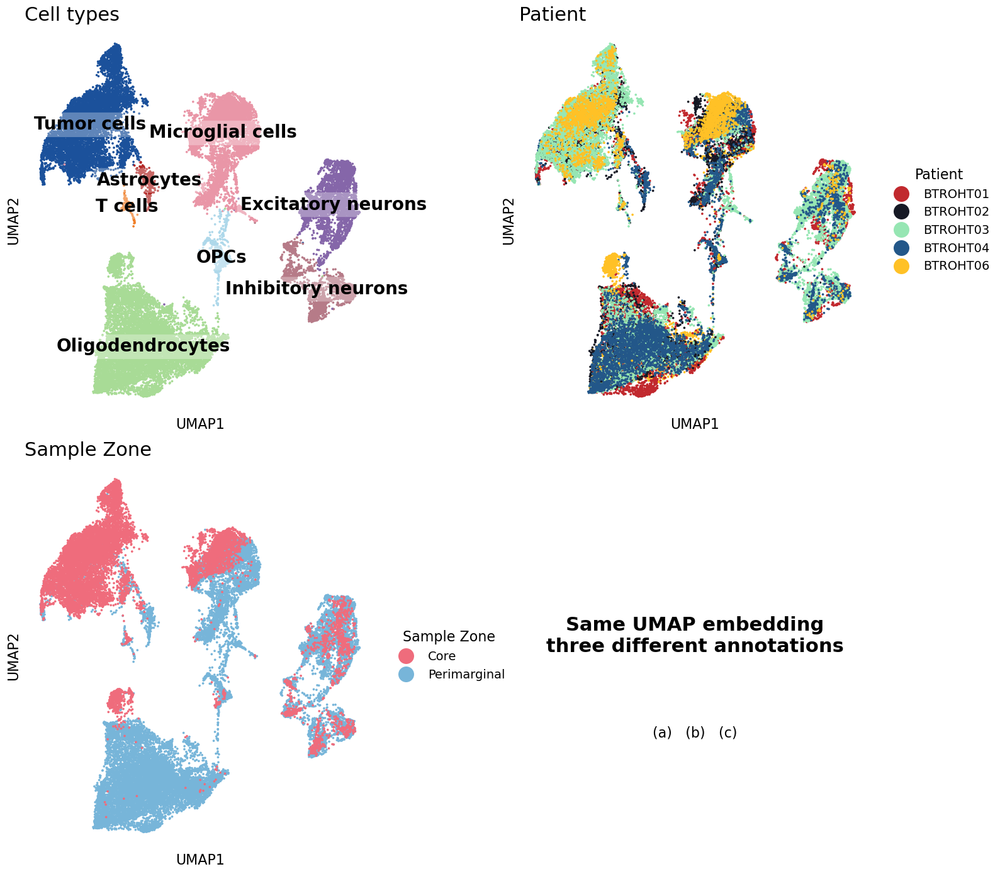

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

# -------- unified styling --------
POINT_SIZE   = 28
TITLE_SIZE   = 22
LABEL_SIZE   = 16
TICK_SIZE    = 12
LEGEND_SIZE  = 14
LEGEND_TITLE = 16
MARKERSCALE  = 3.0

def style_axis(ax, title=None):
    ax.set_xlabel("UMAP1", fontsize=LABEL_SIZE)
    ax.set_ylabel("UMAP2", fontsize=LABEL_SIZE)
    if title:
        ax.set_title(title, fontsize=TITLE_SIZE, pad=6, loc='left')  # ← title on left
    for s in ax.spines.values():
        s.set_visible(False)
    ax.tick_params(axis='both', which='major', labelsize=TICK_SIZE)


def add_categorical_legend(ax, cats, colors, *, title, rename_map=None):
    labels = [rename_map.get(c, c) if rename_map else c for c in cats]
    handles = [Line2D([0],[0], marker='o', linestyle='',
                      markerfacecolor=colors[i], markeredgecolor='none', markersize=6)
               for i in range(len(cats))]
    leg = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5),
                    fontsize=LEGEND_SIZE, frameon=False, title=title, markerscale=MARKERSCALE)
    if leg.get_title(): leg.get_title().set_fontsize(LEGEND_TITLE)

# -------- ensure categories & colors --------
all_data.obs["Bigannotation"] = all_data.obs["Bigannotation"].astype("category")
all_data.obs["patient"]       = all_data.obs["patient"].astype("category")
all_data.obs["site"]          = all_data.obs["site"].astype("category")

all_data.uns["Bigannotation_colors"] = [
    cell_type_colors[ct] for ct in all_data.obs["Bigannotation"].cat.categories
]
all_data.uns["patient_colors"] = [
    patient_colors[pt] for pt in all_data.obs["patient"].cat.categories
]
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
all_data.uns["site_colors"] = [site_colors[s] for s in all_data.obs["site"].cat.categories]

# -------- figure: 2×2 --------
fig, axs = plt.subplots(2, 2, figsize=(16, 14))
ax00, ax01, ax10, ax11 = axs.ravel()

# (0,0) Bigannotation — no legend; in-plot labels
sc.pl.umap(
    all_data, color="Bigannotation", size=POINT_SIZE, frameon=True,
    ax=ax00, show=False, legend_loc=None, title=""   # ❌ remove auto "Bigannotation"
)
style_axis(ax00, "Cell types")

umap_df = pd.DataFrame(all_data.obsm["X_umap"], columns=["UMAP1","UMAP2"])
umap_df["label"] = all_data.obs["Bigannotation"].values
for lab in umap_df["label"].unique():
    x = umap_df.loc[umap_df["label"] == lab, "UMAP1"].median()
    y = umap_df.loc[umap_df["label"] == lab, "UMAP2"].median()
    ax00.text(
        x, y, str(lab),
        fontsize=LABEL_SIZE+4, weight='bold',
        ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.3, edgecolor='none', boxstyle='round,pad=0.2')
    )

# (0,1) Patient — keep legend/colors
sc.pl.umap(
    all_data, color="patient", size=POINT_SIZE, frameon=True,
    ax=ax01, show=False, legend_loc=None, title=""   # ❌ remove auto "patient"
)
style_axis(ax01, "Patient")
add_categorical_legend(
    ax01,
    list(all_data.obs["patient"].cat.categories),
    list(all_data.uns["patient_colors"]),
    title="Patient"
)

# (1,0) Site — keep legend/colors; rename Peri→Perimarginal in legend only
sc.pl.umap(
    all_data, color="site", size=POINT_SIZE, frameon=True,
    ax=ax10, show=False, legend_loc=None, title=""   # ❌ remove auto "site"
)
style_axis(ax10, "Sample Zone")
add_categorical_legend(
    ax10,
    list(all_data.obs["site"].cat.categories),
    list(all_data.uns["site_colors"]),
    title="Sample Zone",
    rename_map={"Peri": "Perimarginal", "Core": "Core"}
)

# (1,1) Info panel
ax11.axis('off')
ax11.text(
    0.5, 0.55,
    "Same UMAP embedding\nthree different annotations",
    ha="center", va="center", fontsize=TITLE_SIZE, weight="bold"
)
ax11.text(
    0.5, 0.30,
    "Top-left: (a) (labels on map)\n"
    "Top-right: (b) (legend preserved)\n"
    "Bottom-left: (c) (legend preserved)",
    ha="center", va="center", fontsize=LABEL_SIZE
)

plt.tight_layout()
# Optional: save
# plt.savefig("umap_2x2_three_plus_info.png", dpi=300, bbox_inches="tight")
plt.show()


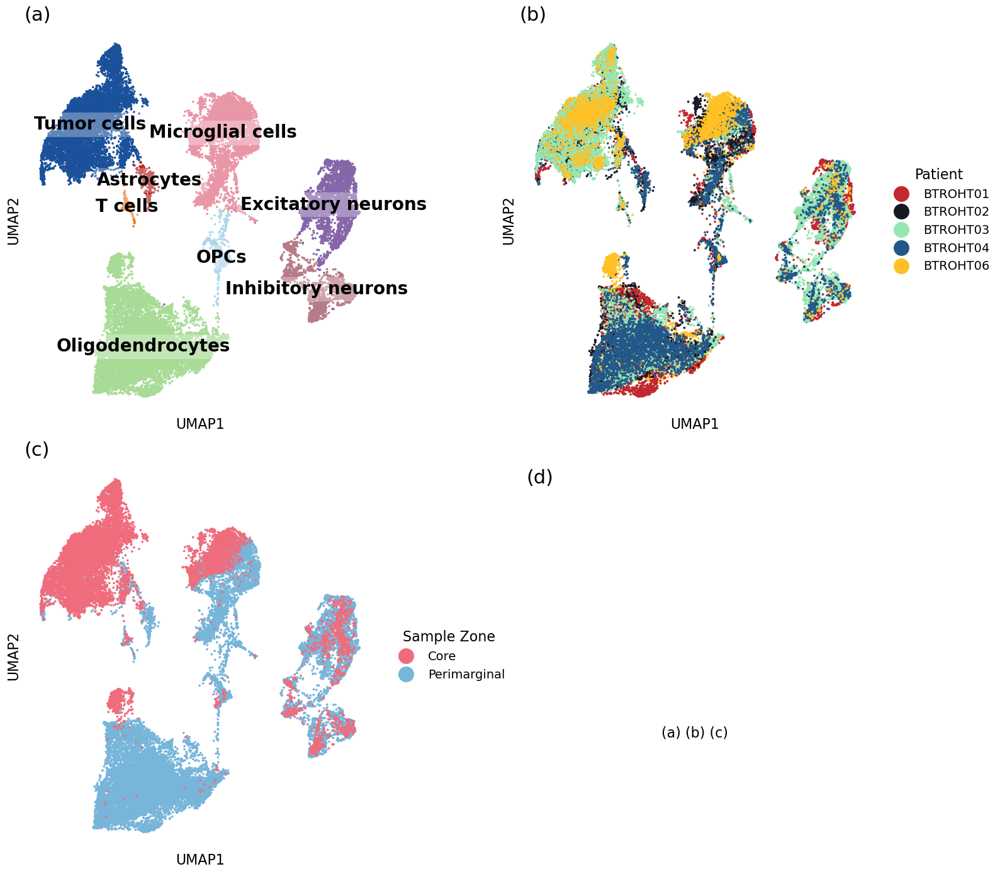

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

# -------- unified styling --------
POINT_SIZE   = 28
TITLE_SIZE   = 22
LABEL_SIZE   = 16
TICK_SIZE    = 12
LEGEND_SIZE  = 14
LEGEND_TITLE = 16
MARKERSCALE  = 3.0

def style_axis(ax, title=None):
    ax.set_xlabel("UMAP1", fontsize=LABEL_SIZE)
    ax.set_ylabel("UMAP2", fontsize=LABEL_SIZE)
    if title:
        ax.set_title(title, fontsize=TITLE_SIZE, pad=6, loc='left')
    for s in ax.spines.values():
        s.set_visible(False)
    ax.tick_params(axis='both', which='major', labelsize=TICK_SIZE)


def add_categorical_legend(ax, cats, colors, *, title, rename_map=None):
    labels = [rename_map.get(c, c) if rename_map else c for c in cats]
    handles = [Line2D([0],[0], marker='o', linestyle='',
                      markerfacecolor=colors[i], markeredgecolor='none', markersize=6)
               for i in range(len(cats))]
    leg = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5),
                    fontsize=LEGEND_SIZE, frameon=False, title=title, markerscale=MARKERSCALE)
    if leg.get_title(): leg.get_title().set_fontsize(LEGEND_TITLE)

# -------- ensure categories & colors --------
all_data.obs["Bigannotation"] = all_data.obs["Bigannotation"].astype("category")
all_data.obs["patient"]       = all_data.obs["patient"].astype("category")
all_data.obs["site"]          = all_data.obs["site"].astype("category")

all_data.uns["Bigannotation_colors"] = [
    cell_type_colors[ct] for ct in all_data.obs["Bigannotation"].cat.categories
]
all_data.uns["patient_colors"] = [
    patient_colors[pt] for pt in all_data.obs["patient"].cat.categories
]
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
all_data.uns["site_colors"] = [site_colors[s] for s in all_data.obs["site"].cat.categories]

# -------- figure: 2×2 --------
fig, axs = plt.subplots(2, 2, figsize=(16, 14))
ax00, ax01, ax10, ax11 = axs.ravel()

# (0,0) Bigannotation — panel (a)
sc.pl.umap(
    all_data, color="Bigannotation", size=POINT_SIZE, frameon=True,
    ax=ax00, show=False, legend_loc=None, title=""
)
style_axis(ax00, "(a)")
umap_df = pd.DataFrame(all_data.obsm["X_umap"], columns=["UMAP1","UMAP2"])
umap_df["label"] = all_data.obs["Bigannotation"].values
for lab in umap_df["label"].unique():
    x = umap_df.loc[umap_df["label"] == lab, "UMAP1"].median()
    y = umap_df.loc[umap_df["label"] == lab, "UMAP2"].median()
    ax00.text(
        x, y, str(lab),
        fontsize=LABEL_SIZE+4, weight='bold',
        ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.3, edgecolor='none', boxstyle='round,pad=0.2')
    )

# (0,1) Patient — panel (b)
sc.pl.umap(
    all_data, color="patient", size=POINT_SIZE, frameon=True,
    ax=ax01, show=False, legend_loc=None, title=""
)
style_axis(ax01, "(b)")
add_categorical_legend(
    ax01,
    list(all_data.obs["patient"].cat.categories),
    list(all_data.uns["patient_colors"]),
    title="Patient"
)

# (1,0) Site — panel (c)
sc.pl.umap(
    all_data, color="site", size=POINT_SIZE, frameon=True,
    ax=ax10, show=False, legend_loc=None, title=""
)
style_axis(ax10, "(c)")
add_categorical_legend(
    ax10,
    list(all_data.obs["site"].cat.categories),
    list(all_data.uns["site_colors"]),
    title="Sample Zone",
    rename_map={"Peri": "Perimarginal", "Core": "Core"}
)

# (1,1) Info panel
ax11.axis('off')
ax11.text(
    0.02, 0.98, "(d)",
    transform=ax11.transAxes,
    ha="left", va="top",
    fontsize=TITLE_SIZE
)


ax11.text(
    0.5, 0.30,
    "(a) (b) (c)",
    ha="center", va="center", fontsize=LABEL_SIZE
)


# (1,1) Panel (d) — empty, only the label


plt.tight_layout()
# Optional: save high-res
# plt.savefig("umap_2x2_three_plus_info_labeled.png", dpi=300, bbox_inches="tight")
plt.show()


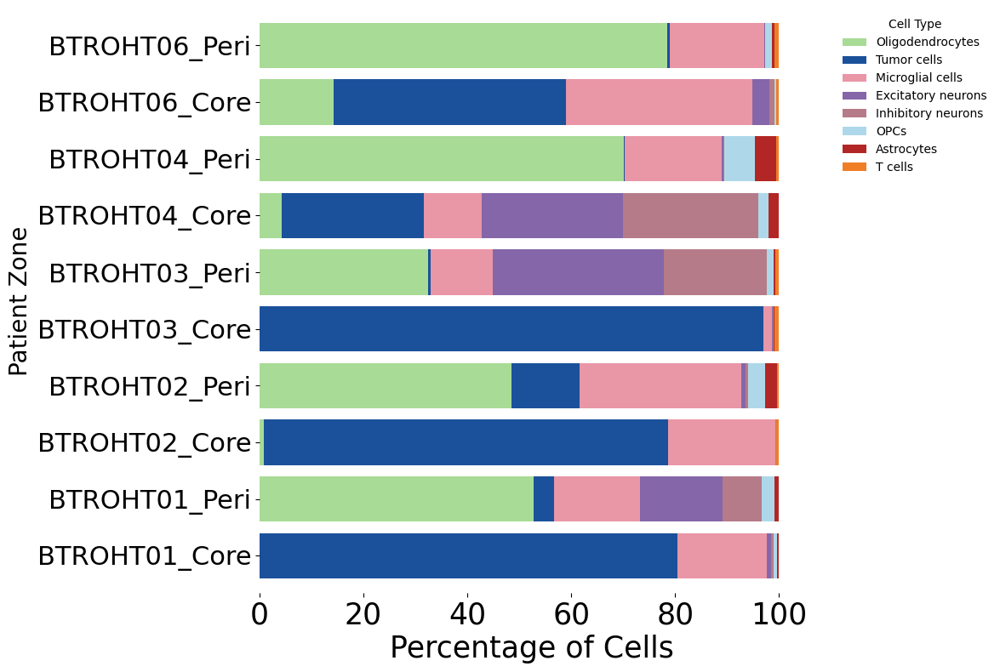

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Cross-tabulate counts of cell types per patient zone
count_df = pd.crosstab(all_data.obs["patientzone"], all_data.obs["Bigannotation"])

# 2. Normalize to get percentages
percent_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

# 3. Reorder columns to match your custom color dict
percent_df = percent_df[[ct for ct in cell_type_colors.keys() if ct in percent_df.columns]]

# 4. Plot
ax = percent_df.plot(
    kind="barh",
    stacked=True,
    figsize=(12, 8),
    color=[cell_type_colors[ct] for ct in percent_df.columns],
    width=0.8
)

# Remove the box around the plot (spines)
for spine in ax.spines.values():
    spine.set_visible(False)

# Axis labels and ticks
ax.set_xlabel("Percentage of Cells", fontsize=25)
ax.set_ylabel("Patient Zone", fontsize=20)
plt.yticks(fontsize=22)
plt.xticks(fontsize=25)

# Legend
plt.legend(title="Cell Type", bbox_to_anchor=(1.05, 1), loc="upper left", frameon=False)

plt.tight_layout()
plt.show()


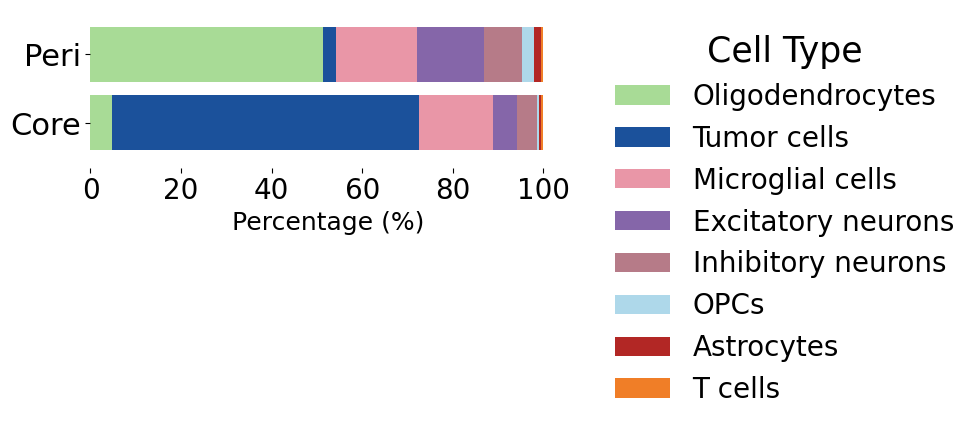

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Cross-tabulate counts of cell types per patient
count_df = pd.crosstab(all_data.obs["site"], all_data.obs["Bigannotation"])

# 2. Normalize to get percentages
percent_df = count_df.div(count_df.sum(axis=1), axis=0) * 100

# 3. Reorder columns to match your color palette
percent_df = percent_df[[ct for ct in cell_type_colors.keys() if ct in percent_df.columns]]

# 4. Plot
ax = percent_df.plot(
    kind="barh",
    stacked=True,
    figsize=(10, 3.35),
    color=[cell_type_colors[ct] for ct in percent_df.columns],
    width=0.8
)

# ✅ Remove the box (spines)
for spine in ax.spines.values():
    spine.set_visible(False)

# Axis styling
ax.set_xlabel("Percentage (%)", fontsize=18)
ax.set_ylabel("", fontsize=22)
plt.yticks(fontsize=22)
plt.xticks(fontsize=20)

# ✅ Customize legend (size, title, spacing)
legend = ax.legend(
    title="Cell Type",
    title_fontsize=25,      # legend title size
    fontsize=20,            # legend text size
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    frameon=False           # remove box around legend
)

# Clean layout
plt.tight_layout()
plt.show()


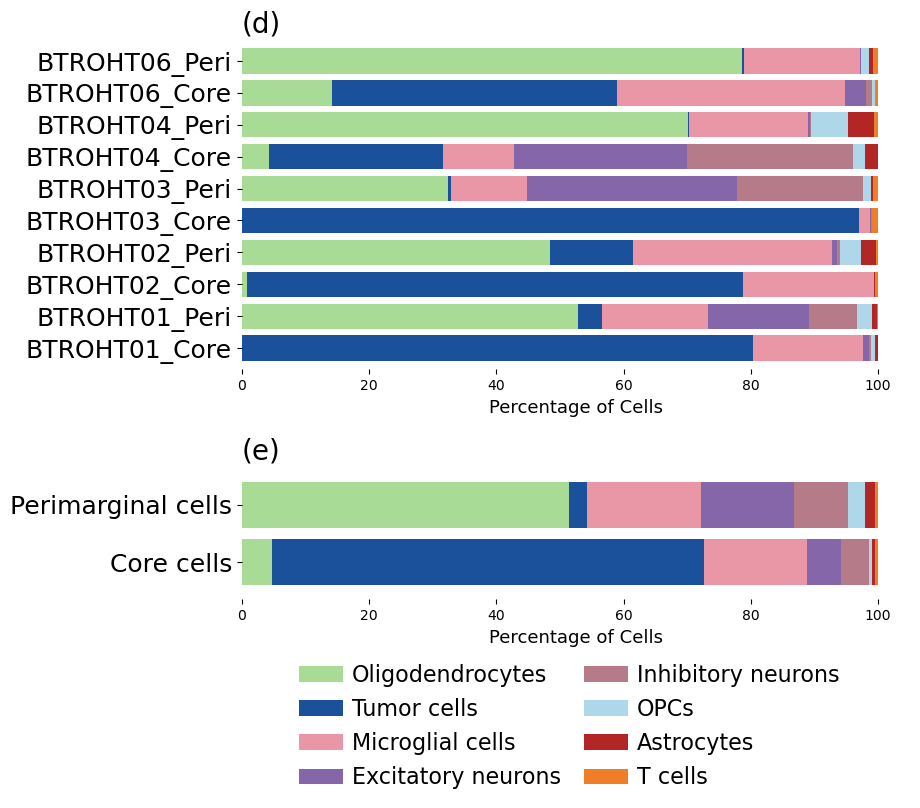

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === 1️⃣ First plot: patientzone ===
count_df_zone = pd.crosstab(all_data.obs["patientzone"], all_data.obs["Bigannotation"])
percent_df_zone = count_df_zone.div(count_df_zone.sum(axis=1), axis=0) * 100
percent_df_zone = percent_df_zone[[ct for ct in cell_type_colors.keys() if ct in percent_df_zone.columns]]

# === 2️⃣ Second plot: site ===
count_df_site = pd.crosstab(all_data.obs["site"], all_data.obs["Bigannotation"])
percent_df_site = count_df_site.div(count_df_site.sum(axis=1), axis=0) * 100
percent_df_site = percent_df_site[[ct for ct in cell_type_colors.keys() if ct in percent_df_site.columns]]
percent_df_site = percent_df_site.rename(index={
    "Peri": "Perimarginal cells",
    "Core": "Core cells"
})

# === Figure (for 2×2 subplot bottom-right size proportions) ===
fig, (ax1, ax2) = plt.subplots(
    2, 1, figsize=(9.3, 8.3),  # small size for embedding
    gridspec_kw={'height_ratios': [2.5, 1]}  # balance space visually
)

# --- Plot (d): patient zone ---
percent_df_zone.plot(
    kind="barh",
    stacked=True,
    ax=ax1,
    color=[cell_type_colors[ct] for ct in percent_df_zone.columns],
    width=0.8
)
for spine in ax1.spines.values():
    spine.set_visible(False)
ax1.set_xlabel("Percentage of Cells", fontsize=13)
ax1.set_ylabel("", fontsize=6)
ax1.tick_params(axis='y', labelsize=18)
ax1.tick_params(axis='x', labelsize=10)
if ax1.get_legend() is not None:
    ax1.get_legend().remove()
ax1.set_title("(d)", loc="left", fontsize=20)
# --- Plot (e): site (with legend UNDER the plot) ---
percent_df_site.plot(
    kind="barh",
    stacked=True,
    ax=ax2,
    color=[cell_type_colors[ct] for ct in percent_df_site.columns],
    width=0.8
)
for spine in ax2.spines.values():
    spine.set_visible(False)

ax2.set_xlabel("Percentage of Cells", fontsize=13)
ax2.set_ylabel("", fontsize=6)
ax2.tick_params(axis='y', labelsize=18)
ax2.tick_params(axis='x', labelsize=10)
ax2.set_title("(e)", loc="left", fontsize=20)

# ✅ Legend BELOW the plot
handles, labels = ax2.get_legend_handles_labels()
legend = ax2.legend(
    handles,
    labels,
    title="",
    title_fontsize=14,
    fontsize=16,
    loc="upper center",
    bbox_to_anchor=(0.49, -0.34),  # ⬅️ Move legend below the plot
    ncol=2,                       # 2 columns
    frameon=False,
    labelspacing=0.5,
    columnspacing=1.0,
    handletextpad=0.4
)

plt.tight_layout(h_pad=1.5)
plt.show()


# InferCNV

In [ ]:
import infercnvpy as cnv
adata_add = cnv.datasets.maynard2020_3k()
adata_add.var.loc[:, ["ensg", "chromosome", "start", "end"]]
adata_add

AnnData object with n_obs × n_vars = 3000 × 55556
    obs: 'age', 'sex', 'sample', 'patient', 'cell_type'
    var: 'ensg', 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_counts', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'cell_type_colors', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    obsp: 'connectivities', 'distances'

In [ ]:
adata_inf=all_data.raw.to_adata()
adata_inf.var['end']=adata_add.var.loc[:, ["end"]]
adata_inf.var['start']=adata_add.var.loc[:, ["start"]]
adata_inf.var['chromosome']=adata_add.var.loc[:, ["chromosome"]]
adata_inf.var.loc[:, [ "chromosome", "start", "end"]]

,chromosome,start,end
MIR1302-2HG,chr1,29554.0,31109.0
FAM138A,chr1,34554.0,36081.0
OR4F5,chr1,65419.0,71585.0
AL627309.1,chr1,89295.0,133723.0
AL627309.3,chr1,89551.0,91105.0
...,...,...,...
AC141272.1,KI270728.1,1270984.0,1271271.0
AC023491.2,KI270731.1,10598.0,13001.0
AC007325.1,KI270734.1,72411.0,74814.0
AC007325.4,KI270734.1,131494.0,137392.0


In [ ]:
cnv.tl.infercnv(
    adata_inf,
    reference_key="Bigannotation",
    window_size=250,
    reference_cat=[
    "Oligodendrocytes","Excitatory neurons","Astrocytes", "Microglial cells","T cells"
    ]
)

  0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
cnv.tl.pca(adata_inf)
cnv.pp.neighbors(adata_inf, )
cnv.tl.leiden(adata_inf,resolution=1)

/home/fatemeh.nasrabadi/anaconda3/envs/new_scenv/lib/python3.11/site-packages/infercnvpy/tl/__init__.py:24: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  return sc.tl.leiden(


In [ ]:
cnv.tl.umap(adata_inf)
cnv.tl.cnv_score(adata_inf)

/tmp/ipykernel_1102326/116291230.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  my_cmap = cm.get_cmap("RdBu_r")
/home/fatemeh.nasrabadi/anaconda3/envs/new_scenv/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


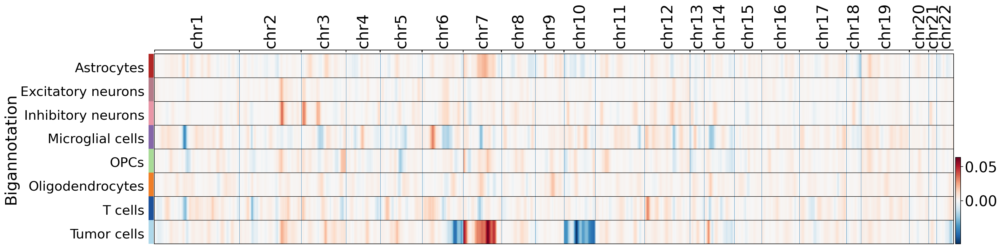

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm

# Increase font size and set style
sns.set_context("notebook", font_scale=3)  # adjust font size multiplier

# Set a wider figure size globally (if supported by the plot function)
plt.rcParams["figure.figsize"] = (22, 6)  # width x height in inches

# Define custom colormap
my_cmap = cm.get_cmap("RdBu_r")

# Plot the summary heatmap
cnv.pl.chromosome_heatmap_summary(
    adata_inf,
    groupby="Bigannotation",
    cmap=my_cmap,
    figsize=(33, 8)  # If the function supports it; if not, above rcParams applies
)


/tmp/ipykernel_1102326/977845523.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  my_cmap = cm.get_cmap("RdBu_r")
/home/fatemeh.nasrabadi/anaconda3/envs/new_scenv/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


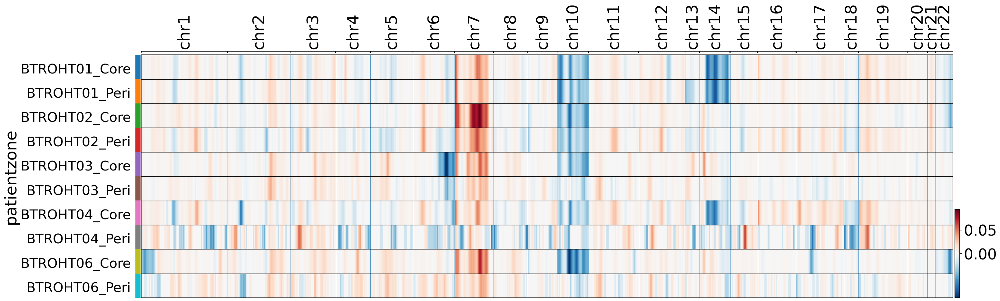

In [ ]:
# Filter only Tumor cells
adata_tumor = adata_inf[adata_inf.obs["Bigannotation"] == "Tumor cells"]


# Increase font size and set style
sns.set_context("notebook", font_scale=3)  # adjust font size multiplier

# Set a wider figure size globally (if supported by the plot function)
plt.rcParams["figure.figsize"] = (22, 6)  # width x height in inches

# Define custom colormap
my_cmap = cm.get_cmap("RdBu_r")

# Plot chromosome heatmap grouped by 'site' (only for Tumor cells)
cnv.pl.chromosome_heatmap_summary(
    adata_tumor,
    groupby="patientzone",       # <-- group tumor cells by site
    cmap="RdBu_r" ,        # Optional: use blue-red reversed colormap
    figsize=(33, 10)
)


/tmp/ipykernel_1102326/977845523.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  my_cmap = cm.get_cmap("RdBu_r")
/home/fatemeh.nasrabadi/anaconda3/envs/new_scenv/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


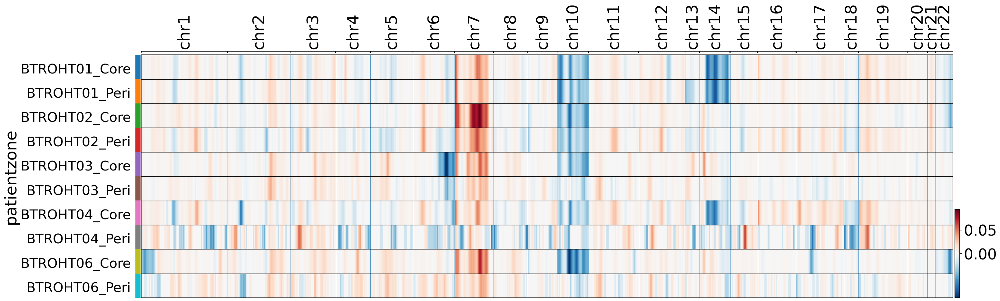

In [ ]:
# Filter only Tumor cells
adata_tumor = adata_inf[adata_inf.obs["Bigannotation"] == "Tumor cells"]


# Increase font size and set style
sns.set_context("notebook", font_scale=3)  # adjust font size multiplier

# Set a wider figure size globally (if supported by the plot function)
plt.rcParams["figure.figsize"] = (22, 6)  # width x height in inches

# Define custom colormap
my_cmap = cm.get_cmap("RdBu_r")

# Plot chromosome heatmap grouped by 'site' (only for Tumor cells)
cnv.pl.chromosome_heatmap_summary(
    adata_tumor,
    groupby="patientzone",       # <-- group tumor cells by site
    cmap="RdBu_r" ,        # Optional: use blue-red reversed colormap
    figsize=(33, 10)
)


In [ ]:
tumor = sc.read("/home/fatemeh.nasrabadi/ROVIGO_congas/final/Tumorcells.h5ad")

In [ ]:
adata_inf.obs["NES_binary_CvsP"] = tumor.obs["NES_binary_CvsP"]

/home/fatemeh.nasrabadi/anaconda3/envs/new_scenv/lib/python3.11/site-packages/anndata/_core/storage.py:85: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


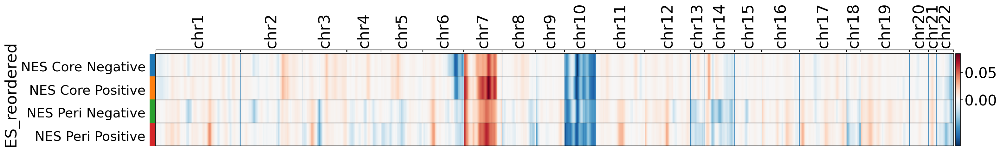

In [ ]:
# Filter only Tumor cells
adata_tumor = adata_inf[adata_inf.obs["Bigannotation"] == "Tumor cells"].copy()

# ساخت label جدید با فرمت دلخواه
def reorder_label(x):
    try:
        region, status = x.split(" ", 1)        # جدا کردن Core_NES و Positive/Negative
        region_main = region.split("_")[0]      # گرفتن فقط Core یا Peri
        return f"NES {region_main} {status}"
    except:
        return x

# اعمال تابع به ستون جدید
adata_tumor.obs["NES_reordered"] = adata_tumor.obs["NES_binary_CvsP"].astype(str).apply(reorder_label)

# حذف سلول‌هایی که NES_reordered آنها NaN یا "nan" شده
adata_tumor = adata_tumor[adata_tumor.obs["NES_reordered"].notna()].copy()
adata_tumor = adata_tumor[adata_tumor.obs["NES_reordered"] != "nan"].copy()

# (اختیاری) حذف دسته‌های بدون دیتا
adata_tumor.obs["NES_reordered"] = adata_tumor.obs["NES_reordered"].astype("category")
adata_tumor.obs["NES_reordered"] = adata_tumor.obs["NES_reordered"].cat.remove_unused_categories()

# حالا پلات
cnv.pl.chromosome_heatmap_summary(
    adata_tumor,
    groupby="NES_reordered",
    cmap="RdBu_r",
    figsize=(33, 4),
)


In [ ]:
ordered_gene_list = [
    # Tumor cells
    'PTPRZ1', 'NOVA1', 'LHFPL3', 'TRIO', 'EGFR',

    # Oligodendrocyte
    'CTNNA3', 'IL1RAPL1', 'MBP', 'ST18', 'PLP1',

    # Astrocyte
    'GFAP', 'ATP1A2', 'AQP4', 'MRVI1', 'LINC00299',

    # OPC
    'DSCAM', 'TNR', 'PCDH15', 'VCAN', 'LRRC4C',

    # Excitatory neurons
    'STXBP5L', 'SYT1', 'RALYL', 'RYR2', 'PHACTR1',

    # Inhibitory neurons
    'CNTNAP2', 'SNHG14', 'GRIP1', 'DLGAP1', 'NRXN3',

    # Microglia
    'PLXDC2', 'DOCK4', 'ARHGAP24', 'SLC11A1', 'LRMDA',

    # T cells
    'PTPRC', 'PARP8', 'SKAP1', 'MBNL1', 'ARHGAP15'
]


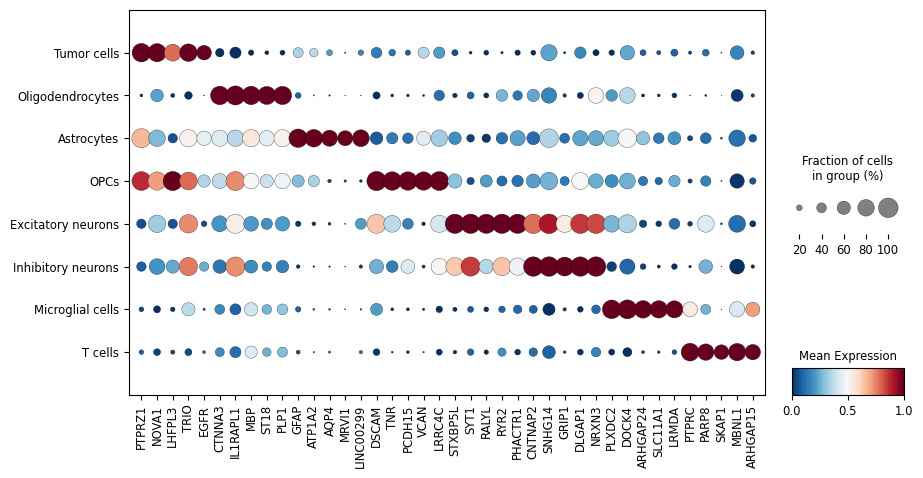

In [ ]:
sc.pl.dotplot(all_data, var_names=ordered_gene_list,
              groupby='Bigannotation',colorbar_title='Mean Expression',
              standard_scale='var',
            categories_order=[ "Tumor cells","Oligodendrocytes","Astrocytes", "OPCs", "Excitatory neurons","Inhibitory neurons","Microglial cells","T cells"],

              cmap='RdBu_r',
              dendrogram=False,figsize=(10,5))

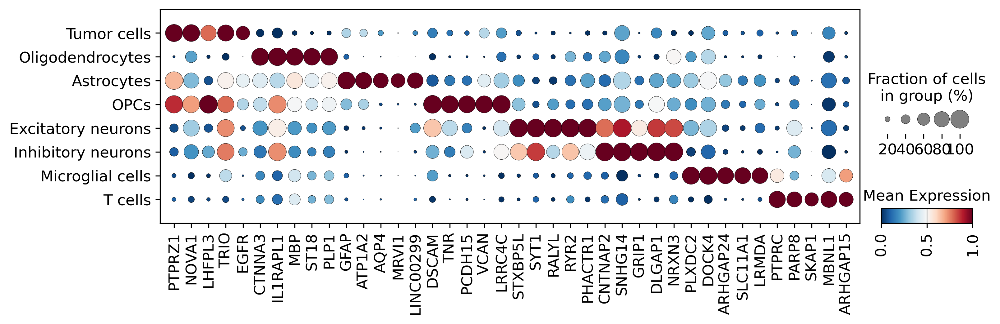

In [ ]:
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt

# Global font settings for poster
sc.set_figure_params(scanpy=True, dpi=150)
mpl.rcParams.update({
    "xtick.labelsize": 60,   # gene labels
    "ytick.labelsize": 60,   # annotations
})

# Dotplot
sc.pl.dotplot(
    all_data,
    var_names=ordered_gene_list,
    groupby='Bigannotation',
    colorbar_title='Mean Expression',
    standard_scale='var',
    categories_order=[
        "Tumor cells","Oligodendrocytes","Astrocytes","OPCs",
        "Excitatory neurons","Inhibitory neurons","Microglial cells","T cells"
    ],
    cmap='RdBu_r',
    dendrogram=False,
    figsize=(13, 5),   # ⬅️ make figure much larger
    dot_min=0.01,      # ⬅️ minimum dot size
    dot_max=1,       # ⬅️ maximum dot size (must be <=1)
    show=False
)

# Rotate gene labels (x-axis) for readability
ax = plt.gca()
for lab in ax.get_xticklabels():
    lab.set_rotation(90)
    lab.set_ha('center')

# Add extra space for labels so dots don’t overlap
plt.subplots_adjust(bottom=0.45, right=0.85)

plt.show()


# TUMOR

In [ ]:
tumor= sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_row_FINAL_afteratac8121.h5ad")

In [ ]:
tumor

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source'

In [ ]:
adata = tumor

In [ ]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.02, max_mean=4, min_disp=0.5)
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=25, )
sc.tl.leiden(adata, resolution=1.5, random_state=11)
sc.tl.umap(adata, random_state=11)

/home/fatemeh.nasrabadi/anaconda3/envs/new_scenv/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:438: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/tmp/ipykernel_591568/3412052750.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.5, random_state=11)


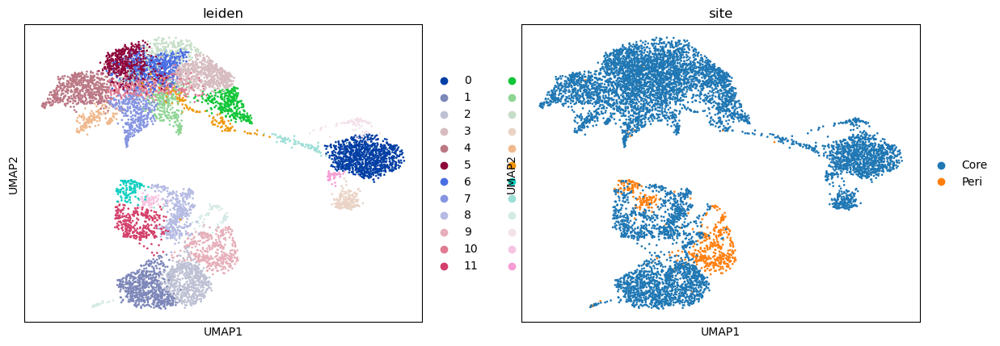

In [ ]:
sc.pl.umap(adata, color=['leiden',"site"], vmax='p80')

In [ ]:
import scanpy as sc

# --- you already ran preprocessing + PCA above ---

# 1) Harmony integrate on the PCA space (batch = "patient")
#    Writes the corrected PCs to: adata.obsm["X_pca_harmony"]
sc.external.pp.harmony_integrate(adata, key="patient")

# 2) Build graph on Harmony PCs
#    (use_rep tells neighbors to use the corrected embedding)
sc.pp.neighbors(
    adata,
    n_neighbors=15,
    use_rep="X_pca_harmony"   # <- important
)

# 3) UMAP on Harmony graph
sc.tl.umap(adata, random_state=11)

# 4) (Optional) Re-run clustering on Harmony graph (recommended)
sc.tl.leiden(adata, resolution=1.5, random_state=11)


2025-10-19 19:50:48,044 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-10-19 19:50:50,381 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-10-19 19:50:50,462 - harmonypy - INFO - Iteration 1 of 10
2025-10-19 19:50:51,892 - harmonypy - INFO - Iteration 2 of 10
2025-10-19 19:50:53,292 - harmonypy - INFO - Converged after 2 iterations


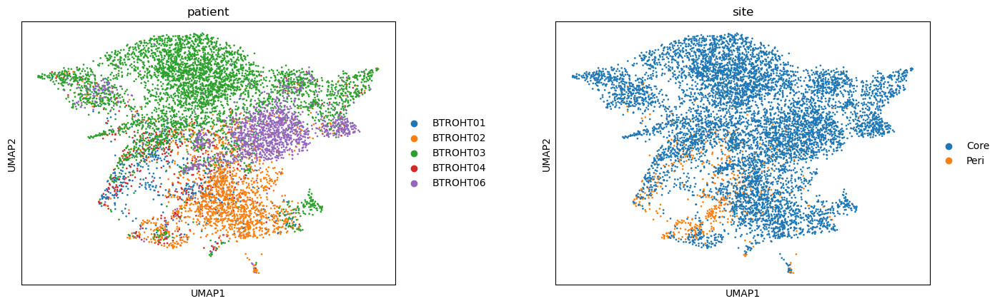

In [ ]:
# 5) Plot UMAP using Harmony result
sc.pl.umap(
    adata,
    color=["patient", "site"],   # add other annotations if you like
    wspace=0.3,
    frameon=True
)


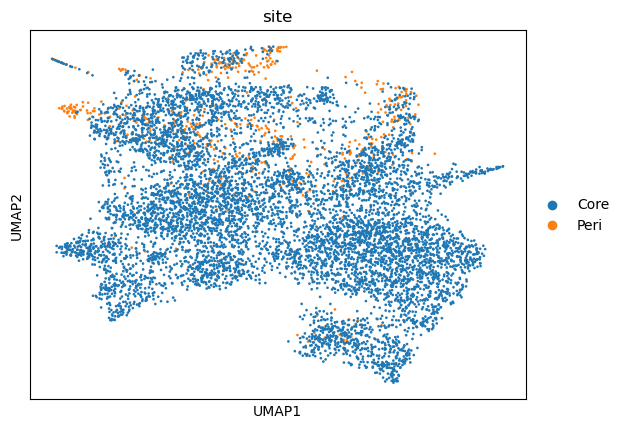

In [ ]:
sc.pl.umap(
    adata,
    color=["site"],   # add other annotations if you like
    wspace=0.3,
    frameon=True
)


In [ ]:
adata.write("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

In [ ]:
tumor = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

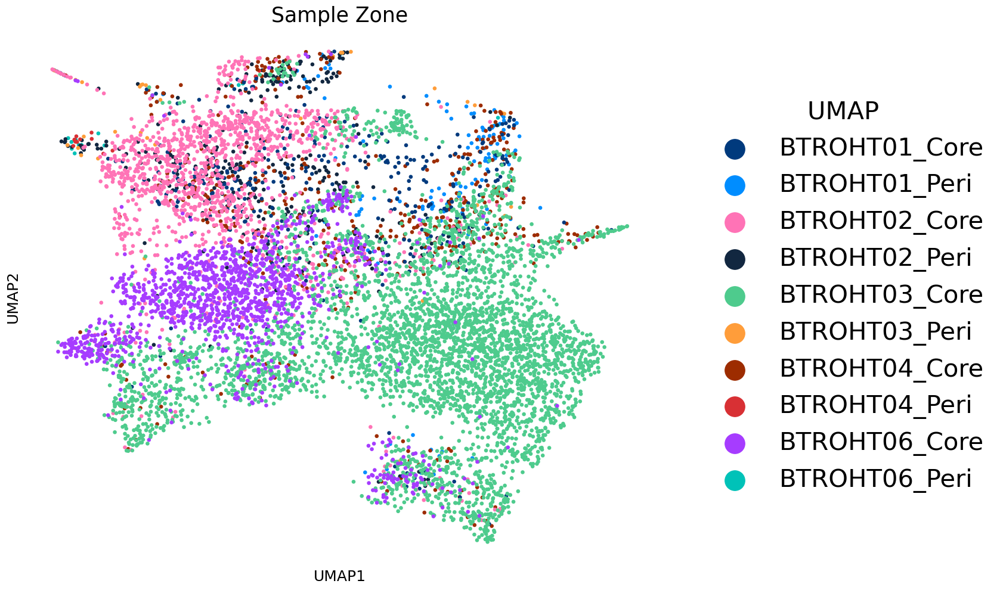

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

import seaborn as sns


# ساخت ستون ترکیبی patient_zone
tumor.obs["patient_zone"] = tumor.obs["patient"].astype(str) + "_" + tumor.obs["site"].astype(str)

# تبدیل به categorical با ترتیب مشخص
tumor.obs["patient_zone"] = pd.Categorical(
    tumor.obs["patient_zone"],
    categories=list(patient_zone_colors.keys()),
    ordered=True
)

# ثبت رنگ‌ها برای patient_zone
tumor.uns["patient_zone_colors"] = [patient_zone_colors[pz] for pz in tumor.obs["patient_zone"].cat.categories]

# ایجاد شکل
fig, ax = plt.subplots(figsize=(17, 7))

# پلات UMAP
sc.pl.umap(
    tumor,
    color='patient_zone',
    size=90,
    ax=ax,
    show=False,
    frameon=True
)


# Resize the figure
fig.set_size_inches(17,10)

# Access the Axes object
ax = fig.axes[0]

# Set axis labels
ax.set_xlabel("UMAP1", fontsize=18)
ax.set_ylabel("UMAP2", fontsize=18)
ax.set_title("Sample Zone", fontsize=25)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

# Adjust legend
legend = ax.get_legend()
if legend is not None:
    # Update label names
    handles, labels = ax.get_legend_handles_labels()
    label_map = {"Peri": "Perimarginal", "Core": "Core"}
    labels = [label_map.get(label, label) for label in labels]

    legend.remove()
    ax.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=30,
        title="UMAP ",
        title_fontsize=30,
        markerscale=4,
        frameon=False
    )

plt.tight_layout()
plt.show()


In [ ]:
all_data

AnnData object with n_obs × n_vars = 32313 × 36601
    obs: 'site', 'patient', 'patientzone', 'source', 'leiden', 'celltype', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltypist_conf_score_Adult_Human_PrefrontalCortex', 'final_celltype', 'Bigannotation', 'broad_celltype', 'edited_ann', 'Bigannotation_endo_macro', 'Bigannotation_neuron_detail', 'FINAL_ANNOTATION', 'OPCs', 'kmeans_cluster', 'Tumor_finalized_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Bigannotation_colors', 'Bigannotation_neuron_detail_colors', 'FINAL_ANNOTATION_colors', 'broad_celltype_colors', 'cell_typist_majority_voting_Adult_Human_PrefrontalCortex_colors', 'cell_typist_predicted_labels_Adult_Human_PrefrontalCortex_colors', 'celltype_colors', 'dendrogram_Bigannotation', 'edited_ann_colors', 'final_celltyp

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

# ===================== unified styling =====================
POINT_SIZE   = 28
TITLE_SIZE   = 22
LABEL_SIZE   = 16
TICK_SIZE    = 12
LEGEND_SIZE  = 14
LEGEND_TITLE = 16
MARKERSCALE  = 3.0

def style_axis(ax, title=None):
    ax.set_xlabel("UMAP1", fontsize=LABEL_SIZE)
    ax.set_ylabel("UMAP2", fontsize=LABEL_SIZE)
    if title:
        ax.set_title(title, fontsize=TITLE_SIZE, pad=6, loc='left')
    for s in ax.spines.values():
        s.set_visible(False)
    ax.tick_params(axis='both', which='major', labelsize=TICK_SIZE)

def add_categorical_legend(ax, cats, colors, *, title, rename_map=None,
                           loc='center left', bbox=(1.02, 0.5)):
    labels  = [rename_map.get(c, c) if rename_map else c for c in cats]
    handles = [Line2D([0],[0], marker='o', linestyle='',
                      markerfacecolor=colors[i], markeredgecolor='none', markersize=6)
               for i in range(len(cats))]
    leg = ax.legend(handles, labels, loc=loc, bbox_to_anchor=bbox,
                    fontsize=LEGEND_SIZE, frameon=False,
                    title=title, markerscale=MARKERSCALE)
    if leg.get_title():
        leg.get_title().set_fontsize(LEGEND_TITLE)


# ===================== data prep =====================
# patient_zone = patient + "_" + site
tumor.obs["patient_zone"] = tumor.obs["patient"].astype(str) + "_" + tumor.obs["site"].astype(str)
tumor.obs["patient_zone"] = pd.Categorical(
    tumor.obs["patient_zone"],
    categories=list(patient_zone_colors.keys()),
    ordered=True
)
tumor.uns["patient_zone_colors"] = [patient_zone_colors[pz] for pz in tumor.obs["patient_zone"].cat.categories]

# site colors
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
tumor.obs["site"] = tumor.obs["site"].astype("category")
tumor.uns["site_colors"] = [site_colors[s] for s in tumor.obs["site"].cat.categories]


# ===================== figure: 1×2 layout =====================
fig, axs = plt.subplots(1, 2, figsize=(16, 7))
ax0, ax1 = axs.ravel()

# ---------- (a) patient_zone ----------
sc.pl.umap(
    tumor, color="patient_zone", size=POINT_SIZE, frameon=True,
    ax=ax0, show=False, legend_loc=None, title=""
)
style_axis(ax0, "(a)")
add_categorical_legend(
    ax0,
    list(tumor.obs["patient_zone"].cat.categories),
    list(tumor.uns["patient_zone_colors"]),
    title="Patient Zone"
)

# ---------- (b) site ----------
sc.pl.umap(
    tumor, color="site", size=POINT_SIZE, frameon=True,
    ax=ax1, show=False, legend_loc=None, title=""
)
style_axis(ax1, "(b)")
add_categorical_legend(
    ax1,
    list(tumor.obs["site"].cat.categories),
    list(tumor.uns["site_colors"]),
    title="Zone",
    rename_map={"Peri": "Perimarginal", "Core": "Core"}
)

plt.tight_layout()
# Optional: save high-res
# plt.savefig("umap_patientZone_site_sideBySide.png", dpi=300, bbox_inches="tight")
plt.show()


NameError: name 'patient_zone_colors' is not defined

NameError: name 'all_data' is not defined

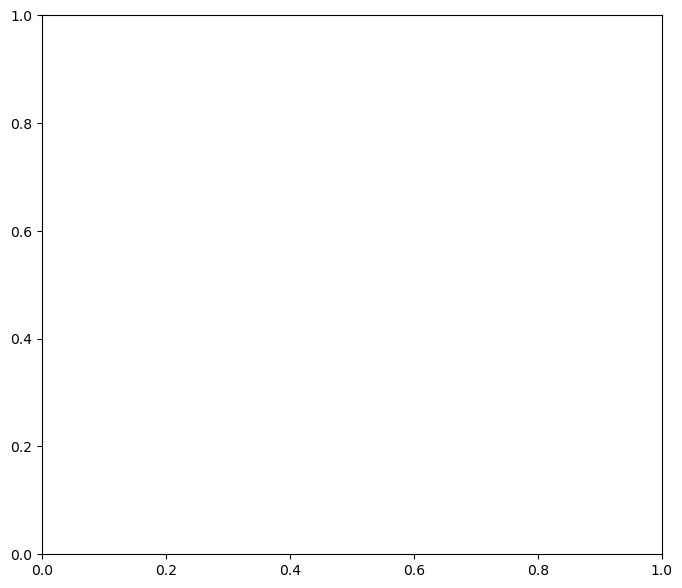

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt

# --- Plot PTPRZ1 expression on UMAP (standalone) ---
fig, ax = plt.subplots(figsize=(8, 7))  # adjust as needed

sc.pl.umap(
    all_data,
    color="PTPRZ1",
    ax=ax,
    show=False,
    frameon=True,
    size=POINT_SIZE,
    cmap="RdBu_r",
    vmin=0,
    vmax=4,
    title=""
)

# --- Label and styling ---
ax.set_title("(d)", fontsize=22, loc="left")  # ⬅️ same size as (b)
ax.set_xlabel("UMAP1", fontsize=16)
ax.set_ylabel("UMAP2", fontsize=16)
for spine in ax.spines.values():
    spine.set_visible(False)
ax.tick_params(length=2, labelsize=12)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === 1️⃣ First plot: patientzone ===
count_df_zone = pd.crosstab(all_data.obs["patientzone"], all_data.obs["Bigannotation"])
percent_df_zone = count_df_zone.div(count_df_zone.sum(axis=1), axis=0) * 100
percent_df_zone = percent_df_zone[[ct for ct in cell_type_colors.keys() if ct in percent_df_zone.columns]]

# === 2️⃣ Second plot: site ===
count_df_site = pd.crosstab(all_data.obs["site"], all_data.obs["Bigannotation"])
percent_df_site = count_df_site.div(count_df_site.sum(axis=1), axis=0) * 100
percent_df_site = percent_df_site[[ct for ct in cell_type_colors.keys() if ct in percent_df_site.columns]]
percent_df_site = percent_df_site.rename(index={
    "Peri": "Perimarginal tumor cells",
    "Core": "Core tumor cells"
})

# === Create figure with height ratio adjustment ===
fig, (ax1, ax2) = plt.subplots(
    2, 1, figsize=(12, 8),
    gridspec_kw={'height_ratios': [2.5, 1.4]}  # ⬅️ Give the lower plot more relative space
)

# --- Plot (d): patientzone ---
percent_df_zone.plot(
    kind="barh",
    stacked=True,
    ax=ax1,
    color=[cell_type_colors[ct] for ct in percent_df_zone.columns],
    width=0.8
)
for spine in ax1.spines.values():
    spine.set_visible(False)
ax1.set_xlabel("Percentage of Cells", fontsize=18)
ax1.set_ylabel("", fontsize=4)
ax1.tick_params(axis='y', labelsize=15)
ax1.tick_params(axis='x', labelsize=18)
if ax1.get_legend() is not None:
    ax1.get_legend().remove()
ax1.set_title("(d)", loc="left", fontsize=18)

# --- Plot (e): site ---
percent_df_site.plot(
    kind="barh",
    stacked=True,
    ax=ax2,
    color=[cell_type_colors[ct] for ct in percent_df_site.columns],
    width=0.8
)
for spine in ax2.spines.values():
    spine.set_visible(False)
ax2.set_xlabel("Percentage of Cells", fontsize=18)
ax2.set_ylabel("", fontsize=4)
ax2.tick_params(axis='y', labelsize=18)
ax2.tick_params(axis='x', labelsize=18)
if ax2.get_legend() is not None:
    ax2.get_legend().remove()
ax2.set_title("(e)", loc="left", fontsize=18)

# --- Layout ---
plt.tight_layout(h_pad=2.0)
plt.show()


NameError: name 'all_data' is not defined

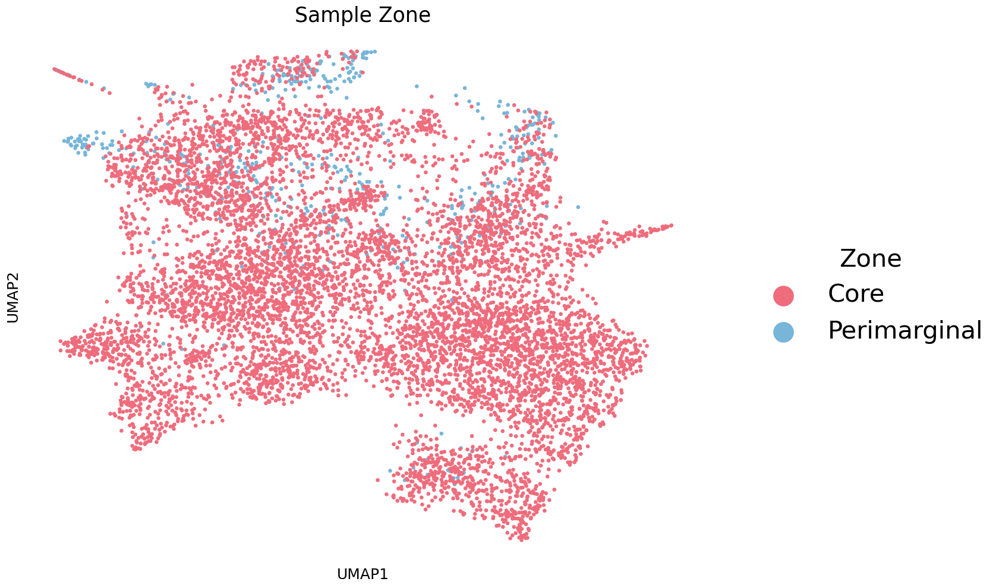

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# Ensure the 'site' column is categorical
tumor.obs["site"] = tumor.obs["site"].astype("category")

# Define custom colors
site_colors = {
    "Core": "#ef6c7c",         # Coral Pink
    "Peri": "#77b5d9"          # Sharper Sky Blue
}

# Apply the colors in the correct order
tumor.uns["site_colors"] = [site_colors[cat] for cat in tumor.obs["site"].cat.categories]

# Plot and capture the figure
fig = sc.pl.umap(
    tumor,
    color='site',
    size=90,
    frameon=True,
    return_fig=True,
    legend_loc='right margin'
)

# Resize the figure
fig.set_size_inches(17, 10)

# Access the Axes object
ax = fig.axes[0]

# Set axis labels
ax.set_xlabel("UMAP1", fontsize=18)
ax.set_ylabel("UMAP2", fontsize=18)
ax.set_title("Sample Zone", fontsize=25)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

# Adjust legend
legend = ax.get_legend()
if legend is not None:
    # Update label names
    handles, labels = ax.get_legend_handles_labels()
    label_map = {"Peri": "Perimarginal", "Core": "Core"}
    labels = [label_map.get(label, label) for label in labels]

    legend.remove()
    ax.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=30,
        title="Zone",
        title_fontsize=30,
        markerscale=4,
        frameon=False
    )

plt.tight_layout()
plt.show()


In [ ]:
all_data = all_data2

In [ ]:
all_data = tumor

/tmp/ipykernel_475108/752304025.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts_patient = tumor.obs.groupby(["patient", "site"]).size().unstack(fill_value=0)
/tmp/ipykernel_475108/752304025.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts_site = tumor.obs.groupby(["site", "patient"]).size().unstack(fill_value=0)


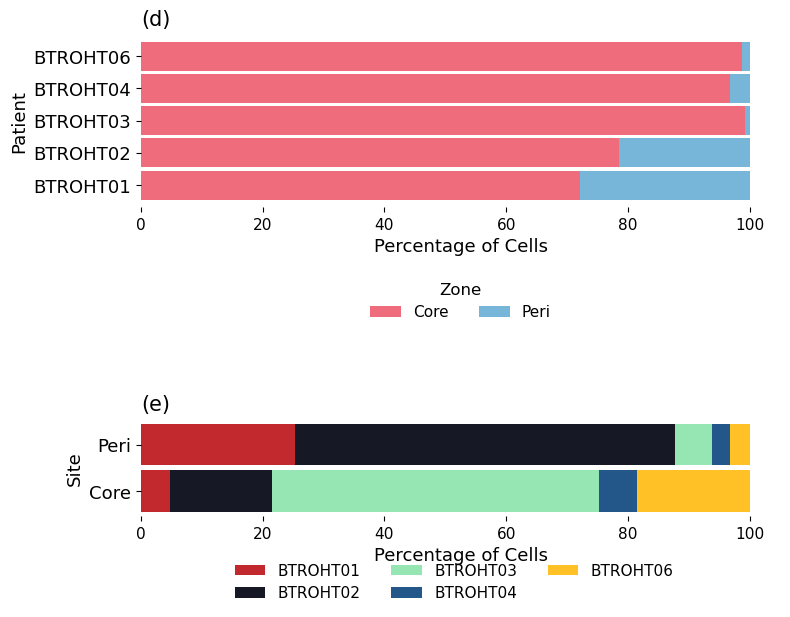

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ==================  FIRST PLOT  ==================
# Count number of cells for each (patient, site)
counts_patient = tumor.obs.groupby(["patient", "site"]).size().unstack(fill_value=0)
percent_patient = counts_patient.div(counts_patient.sum(axis=1), axis=0) * 100

# Colors for Core / Peri
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
colors_site = [site_colors[s] for s in percent_patient.columns]

# ==================  SECOND PLOT  ==================
# Count number of cells for each (site, patient)
counts_site = tumor.obs.groupby(["site", "patient"]).size().unstack(fill_value=0)
percent_site = counts_site.div(counts_site.sum(axis=1), axis=0) * 100
colors_patients = [patient_colors[p] for p in percent_site.columns]

# ==================  COMBINED FIGURE ==================
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(8, 6.5),
    gridspec_kw={'height_ratios': [2.5, 1.4]}
)

# ========== (a) First plot: by Patient ==========
bottom = [0] * len(percent_patient)
for i, col in enumerate(percent_patient.columns):
    ax1.barh(
        y=percent_patient.index,
        width=percent_patient[col],
        left=bottom,
        color=colors_site[i],
        label=col,
        height=0.9
    )
    bottom = [x + y for x, y in zip(bottom, percent_patient[col])]

# Formatting
for s in ax1.spines.values(): s.set_visible(False)
ax1.set_xlabel("Percentage of Cells", fontsize=13)
ax1.set_ylabel("Patient", fontsize=13)
ax1.set_title("(d)", loc="left", fontsize=15)
ax1.tick_params(axis='y', labelsize=13)
ax1.tick_params(axis='x', labelsize=11)

# ✅ Legend below the first plot
ax1.legend(
    percent_patient.columns,
    title="Zone",
    title_fontsize=12,
    fontsize=11,
    loc='upper center',
    bbox_to_anchor=(0.5, -0.35),
    ncol=2,
    frameon=False
)

# ========== (b) Second plot: by Site ==========
bottom = [0] * len(percent_site)
for i, col in enumerate(percent_site.columns):
    ax2.barh(
        y=percent_site.index,
        width=percent_site[col],
        left=bottom,
        color=colors_patients[i],
        label=col,
        height=0.9
    )
    bottom = [x + y for x, y in zip(bottom, percent_site[col])]

# Formatting
for s in ax2.spines.values(): s.set_visible(False)
ax2.set_xlabel("Percentage of Cells", fontsize=13)
ax2.set_ylabel("Site", fontsize=13)
ax2.set_title("(e)", loc="left", fontsize=15)
ax2.tick_params(axis='y', labelsize=13)
ax2.tick_params(axis='x', labelsize=11)

# ✅ Legend below the second plot (horizontal, 3 columns if many patients)
ax2.legend(
    percent_site.columns,
    title="",
    title_fontsize=12,
    fontsize=11,
    loc='upper center',
    bbox_to_anchor=(0.49, -0.34),
    ncol=3,        # auto adjust if more patients
    frameon=False
)



plt.tight_layout(h_pad=2)
plt.show()


/tmp/ipykernel_475108/2226196632.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts_patient = tumor.obs.groupby(["patient", "site"]).size().unstack(fill_value=0)
/tmp/ipykernel_475108/2226196632.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts_site = tumor.obs.groupby(["site", "patient"]).size().unstack(fill_value=0)


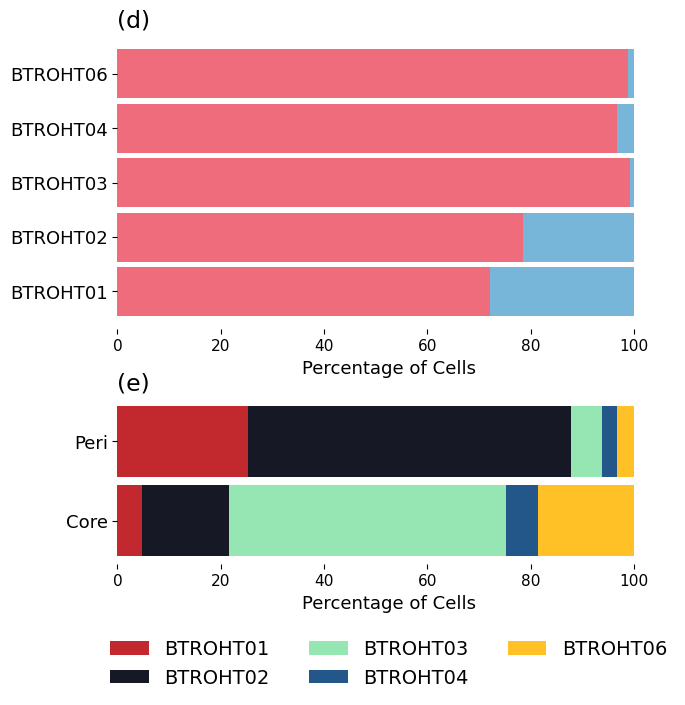

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ==================  FIRST PLOT  ==================
counts_patient = tumor.obs.groupby(["patient", "site"]).size().unstack(fill_value=0)
percent_patient = counts_patient.div(counts_patient.sum(axis=1), axis=0) * 100
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
colors_site = [site_colors[s] for s in percent_patient.columns]

# ==================  SECOND PLOT  ==================
counts_site = tumor.obs.groupby(["site", "patient"]).size().unstack(fill_value=0)
percent_site = counts_site.div(counts_site.sum(axis=1), axis=0) * 100
colors_patients = [patient_colors[p] for p in percent_site.columns]

# ==================  COMBINED FIGURE ==================
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(7 , 8),
    gridspec_kw={'height_ratios': [2.3, 1.3]}
)

# ---------- (d) by Patient ----------
bottom = [0] * len(percent_patient)
for i, col in enumerate(percent_patient.columns):
    ax1.barh(
        y=percent_patient.index,
        width=percent_patient[col],
        left=bottom,
        color=colors_site[i],
        label=col,
        height=0.9
    )
    bottom = [x + y for x, y in zip(bottom, percent_patient[col])]

for s in ax1.spines.values(): s.set_visible(False)
ax1.set_xlabel("Percentage of Cells", fontsize=13)
ax1.set_ylabel("", fontsize=13)
ax1.set_title("(d)", loc="left", fontsize=17)
ax1.tick_params(axis='y', labelsize=13)
ax1.tick_params(axis='x', labelsize=11)

# Legend just under (d)
leg1 = ax1.legend(
    percent_patient.columns, title="",
    title_fontsize=12, fontsize=11,
    loc='upper center', bbox_to_anchor=(0.7, -0.60),  # was -0.35 → closer
    ncol=2, frameon=False
)

# ---------- (e) by Site ----------
bottom = [0] * len(percent_site)
for i, col in enumerate(percent_site.columns):
    ax2.barh(
        y=percent_site.index,
        width=percent_site[col],
        left=bottom,
        color=colors_patients[i],
        label=col,
        height=0.9
    )
    bottom = [x + y for x, y in zip(bottom, percent_site[col])]

for s in ax2.spines.values(): s.set_visible(False)
ax2.set_xlabel("Percentage of Cells", fontsize=13)
ax2.set_ylabel("", fontsize=13)
ax2.set_title("(e)", loc="left", fontsize=17)
ax2.tick_params(axis='y', labelsize=13)
ax2.tick_params(axis='x', labelsize=11)

# Legend under (e), but not overlapping
leg2 = ax2.legend(
    percent_site.columns, title="",
    title_fontsize=12, fontsize=14,
    loc='upper center', bbox_to_anchor=(0.5, -0.35),  # gentler offset
    ncol=3, frameon=False
)

# ---- spacing tweaks ----
fig.subplots_adjust(hspace=0.3, bottom=0.22)  # closer rows; reserve space for bottom legend
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# === 1️⃣ First plot: patientzone ===
count_df_zone = pd.crosstab(all_data.obs["patientzone"], all_data.obs["Bigannotation"])
percent_df_zone = count_df_zone.div(count_df_zone.sum(axis=1), axis=0) * 100
percent_df_zone = percent_df_zone[[ct for ct in cell_type_colors.keys() if ct in percent_df_zone.columns]]

# === 2️⃣ Second plot: site ===
count_df_site = pd.crosstab(all_data.obs["site"], all_data.obs["Bigannotation"])
percent_df_site = count_df_site.div(count_df_site.sum(axis=1), axis=0) * 100
percent_df_site = percent_df_site[[ct for ct in cell_type_colors.keys() if ct in percent_df_site.columns]]
percent_df_site = percent_df_site.rename(index={
    "Peri": "Perimarginal tumor cells",
    "Core": "Core tumor cells"
})

# === Figure (for 2×2 subplot bottom-right size proportions) ===
fig, (ax1, ax2) = plt.subplots(
    2, 1, figsize=(7.7, 7),  # small size for embedding
    gridspec_kw={'height_ratios': [2.5, 1]}  # balance space visually
)

# --- Plot (d): patient zone ---
percent_df_zone.plot(
    kind="barh",
    stacked=True,
    ax=ax1,
    color=[cell_type_colors[ct] for ct in percent_df_zone.columns],
    width=0.8
)
for spine in ax1.spines.values():
    spine.set_visible(False)
ax1.set_xlabel("Percentage of Cells", fontsize=13)
ax1.set_ylabel("", fontsize=6)
ax1.tick_params(axis='y', labelsize=14)
ax1.tick_params(axis='x', labelsize=10)
if ax1.get_legend() is not None:
    ax1.get_legend().remove()
ax1.set_title("(d)", loc="left", fontsize=20)
# --- Plot (e): site (with legend UNDER the plot) ---
percent_df_site.plot(
    kind="barh",
    stacked=True,
    ax=ax2,
    color=[cell_type_colors[ct] for ct in percent_df_site.columns],
    width=0.8
)
for spine in ax2.spines.values():
    spine.set_visible(False)

ax2.set_xlabel("Percentage of Cells", fontsize=13)
ax2.set_ylabel("", fontsize=6)
ax2.tick_params(axis='y', labelsize=14)
ax2.tick_params(axis='x', labelsize=10)
ax2.set_title("(e)", loc="left", fontsize=20)

# ✅ Legend BELOW the plot
handles, labels = ax2.get_legend_handles_labels()
legend = ax2.legend(
    handles,
    labels,
    title="",
    title_fontsize=14,
    fontsize=14,
    loc="upper center",
    bbox_to_anchor=(0.49, -0.34),  # ⬅️ Move legend below the plot
    ncol=2,                       # 2 columns
    frameon=False,
    labelspacing=0.5,
    columnspacing=1.0,
    handletextpad=0.4
)

plt.tight_layout(h_pad=1.5)
plt.show()


In [ ]:
all_data = all_data2

In [ ]:
tumor

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source', 'leiden', 'patient_zone', 'S_score', 'G2M_score', 'phase'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'patient_colors', 'pca', 'site_colors', 'umap', 'patient_zone_colors', 'phase_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# ---- shared style (same as before) ----
TITLE_SIZE   = 18
LABEL_SIZE   = 18
YTICK_SIZE   = 15
XTICK_SIZE   = 18


/tmp/ipykernel_475108/170928421.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts  = tumor.obs.groupby(["site", "patient"]).size().unstack(fill_value=0)


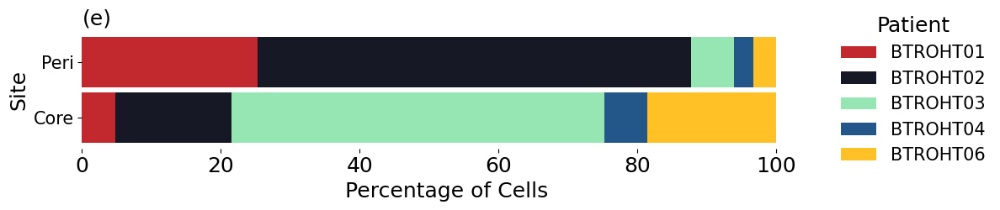

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# counts → % for each (site, patient)
counts  = tumor.obs.groupby(["site", "patient"]).size().unstack(fill_value=0)
percent = counts.div(counts.sum(axis=1), axis=0) * 100

# patient colors (keep your existing mapping)
colors = [patient_colors[p] for p in percent.columns]

fig, ax = plt.subplots(figsize=(12, 2.6))  # similar visual density as (e)

# stacked bars
bottom = [0] * len(percent)
for i, col in enumerate(percent.columns):
    ax.barh(
        y=percent.index,
        width=percent[col],
        left=bottom,
        color=colors[i],
        height=0.9
    )
    bottom = [x + y for x, y in zip(bottom, percent[col])]

# appearance (unified)
for s in ax.spines.values(): s.set_visible(False)
ax.set_xlabel("Percentage of Cells", fontsize=LABEL_SIZE)
ax.set_ylabel("Site", fontsize=LABEL_SIZE)
ax.set_title("(e)", loc="left", fontsize=TITLE_SIZE)
ax.tick_params(axis="y", labelsize=YTICK_SIZE)
ax.tick_params(axis="x", labelsize=XTICK_SIZE)

# legend on the right
ax.legend(
    percent.columns,           # patients
    title="Patient",
    title_fontsize=LABEL_SIZE,
    fontsize=YTICK_SIZE,
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)

plt.tight_layout()
plt.show()


In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

# -------- unified styling --------
POINT_SIZE   = 28
TITLE_SIZE   = 22
LABEL_SIZE   = 16
TICK_SIZE    = 12
LEGEND_SIZE  = 14
LEGEND_TITLE = 16
MARKERSCALE  = 3.0

def style_axis(ax, title=None):
    ax.set_xlabel("UMAP1", fontsize=LABEL_SIZE)
    ax.set_ylabel("UMAP2", fontsize=LABEL_SIZE)
    if title:
        ax.set_title(title, fontsize=TITLE_SIZE, pad=6, loc='left')  # ← title on left
    for s in ax.spines.values():
        s.set_visible(False)
    ax.tick_params(axis='both', which='major', labelsize=TICK_SIZE)


def add_categorical_legend(ax, cats, colors, *, title, rename_map=None):
    labels = [rename_map.get(c, c) if rename_map else c for c in cats]
    handles = [Line2D([0],[0], marker='o', linestyle='',
                      markerfacecolor=colors[i], markeredgecolor='none', markersize=6)
               for i in range(len(cats))]
    leg = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5),
                    fontsize=LEGEND_SIZE, frameon=False, title=title, markerscale=MARKERSCALE)
    if leg.get_title(): leg.get_title().set_fontsize(LEGEND_TITLE)

# -------- ensure categories & colors --------
all_data.obs["patientzone"] = all_data.obs["patientzone"].astype("category")
all_data.obs["site"]       = all_data.obs["site"].astype("category")
all_data.obs["site"]          = all_data.obs["site"].astype("category")

all_data.uns["Bigannotation_colors"] = [
    cell_type_colors[ct] for ct in all_data.obs["Bigannotation"].cat.categories
]
all_data.uns["patient_colors"] = [
    patient_colors[pt] for pt in all_data.obs["patient"].cat.categories
]
site_colors = {"Core": "#ef6c7c", "Peri": "#77b5d9"}
all_data.uns["site_colors"] = [site_colors[s] for s in all_data.obs["site"].cat.categories]

# -------- figure: 2×2 --------
fig, axs = plt.subplots(2, 2, figsize=(16, 14))
ax00, ax01, ax10, ax11 = axs.ravel()

# (0,0) Bigannotation — no legend; in-plot labels
sc.pl.umap(
    all_data, color="Bigannotation", size=POINT_SIZE, frameon=True,
    ax=ax00, show=False, legend_loc=None, title=""   # ❌ remove auto "Bigannotation"
)
style_axis(ax00, "Cell types")

umap_df = pd.DataFrame(all_data.obsm["X_umap"], columns=["UMAP1","UMAP2"])
umap_df["label"] = all_data.obs["Bigannotation"].values
for lab in umap_df["label"].unique():
    x = umap_df.loc[umap_df["label"] == lab, "UMAP1"].median()
    y = umap_df.loc[umap_df["label"] == lab, "UMAP2"].median()
    ax00.text(
        x, y, str(lab),
        fontsize=LABEL_SIZE+4, weight='bold',
        ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.3, edgecolor='none', boxstyle='round,pad=0.2')
    )

# (0,1) Patient — keep legend/colors
sc.pl.umap(
    all_data, color="patient", size=POINT_SIZE, frameon=True,
    ax=ax01, show=False, legend_loc=None, title=""   # ❌ remove auto "patient"
)
style_axis(ax01, "Patient")
add_categorical_legend(
    ax01,
    list(all_data.obs["patient"].cat.categories),
    list(all_data.uns["patient_colors"]),
    title="Patient"
)

# (1,0) Site — keep legend/colors; rename Peri→Perimarginal in legend only
sc.pl.umap(
    all_data, color="site", size=POINT_SIZE, frameon=True,
    ax=ax10, show=False, legend_loc=None, title=""   # ❌ remove auto "site"
)
style_axis(ax10, "Sample Zone")
add_categorical_legend(
    ax10,
    list(all_data.obs["site"].cat.categories),
    list(all_data.uns["site_colors"]),
    title="Sample Zone",
    rename_map={"Peri": "Perimarginal", "Core": "Core"}
)

# (1,1) Info panel
ax11.axis('off')
ax11.text(
    0.5, 0.55,
    "Same UMAP embedding\nthree different annotations",
    ha="center", va="center", fontsize=TITLE_SIZE, weight="bold"
)
ax11.text(
    0.5, 0.30,
    "Top-left: (a) (labels on map)\n"
    "Top-right: (b) (legend preserved)\n"
    "Bottom-left: (c) (legend preserved)",
    ha="center", va="center", fontsize=LABEL_SIZE
)

plt.tight_layout()
# Optional: save
# plt.savefig("umap_2x2_three_plus_info.png", dpi=300, bbox_inches="tight")
plt.show()


# cell cycle analysis

In [ ]:
tumor = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

In [ ]:
tumor

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source', 'leiden', 'patient_zone', 'S_score', 'G2M_score', 'phase'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'patient_colors', 'patient_zone_colors', 'pca', 'phase_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
tumor = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_row_FINAL_afteratac8121.h5ad")

In [ ]:
tumor

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source'

In [ ]:
import scanpy as sc

# Make a copy if you want to keep original raw data
tumor = tumor_raw.copy()

# 1) Normalize each cell to 10,000 counts
sc.pp.normalize_total(tumor, target_sum=1e4)

# 2) Log-transform the normalized data
sc.pp.log1p(tumor)


In [ ]:
s_genes = [
    'MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2',
    'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2',
    'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3',
    'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1',
    'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1'
]



g2m_genes = [
    'E2F8', 'HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A',
    'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3',
    'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11',
    'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20',
    'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8',
    'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE',
    'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA'
]


In [ ]:
sc.tl.score_genes_cell_cycle(tumor, s_genes=s_genes, g2m_genes=g2m_genes)

/tmp/ipykernel_3763332/1362482859.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_3763332/1362482859.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


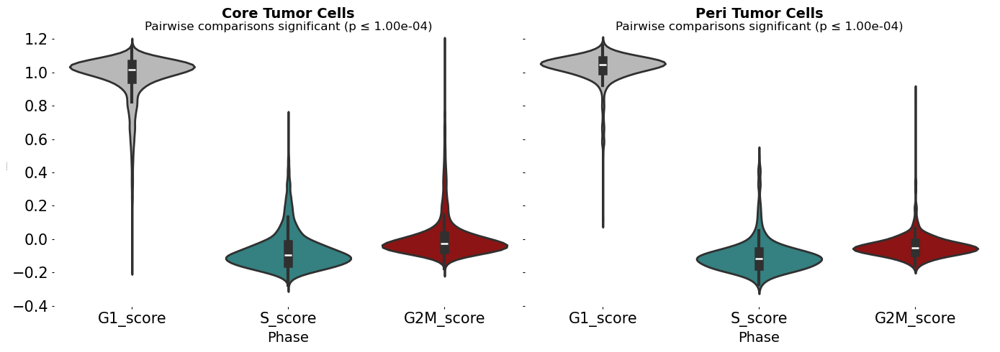

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats

# ساخت G1 از S و G2M
df = tumor.obs[['site', 'S_score', 'G2M_score']].copy()
df['G1_score'] = 1 - df[['S_score', 'G2M_score']].max(axis=1)

# تبدیل به long-form
df_melted = df.melt(id_vars='site', value_vars=['S_score', 'G2M_score', 'G1_score'],
                    var_name='Phase', value_name='Score')

# ترتیب فازها
phase_order = ['G1_score', 'S_score', 'G2M_score']
df_melted["Phase"] = pd.Categorical(df_melted["Phase"], categories=phase_order, ordered=True)

# رنگ‌ها
phase_palette = {
    'S_score': '#298c8c',     # Teal
    'G2M_score': '#a00000',   # Red
    'G1_score': '#b8b8b8'     # Gray
}

# زوج‌های مقایسه‌ای
phase_pairs = [("G1_score", "S_score"), ("S_score", "G2M_score"), ("G1_score", "G2M_score")]

# رسم
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
for idx, site in enumerate(['Core', 'Peri']):
    ax = axes[idx]
    data = df_melted[df_melted['site'] == site]

    sns.violinplot(
        data=data,
        x='Phase',
        y='Score',
        palette=phase_palette,
        ax=ax,
        inner='box',
        linewidth=2
    )

    # محاسبه‌ی p-value برای تمام ترکیب‌ها
    pvals = []
    for g1, g2 in phase_pairs:
        d1 = data[data["Phase"] == g1]["Score"].dropna()
        d2 = data[data["Phase"] == g2]["Score"].dropna()
        stat, p = stats.mannwhitneyu(d1, d2, alternative='two-sided')
        pvals.append(p)

    # خلاصه وضعیت مقایسه‌ها
    if all(p <= 1e-4 for p in pvals):
        comparison_text = "Pairwise comparisons significant (p ≤ 1.00e-04)"
    else:
        comparison_text = "Some comparisons not significant"

    # عنوان بالا
    ax.text(0.5, 0.97, comparison_text, transform=ax.transAxes,
            fontsize=12, ha='center', va='bottom')

    # عنوان نمودار
    ax.set_title(f"{site} Tumor Cells", fontsize=14,weight='bold')
    ax.set_xlabel("Phase",fontsize=14)
    ax.set_ylabel("Cell Cycle Score",fontsize=1)
    # برچسب‌های محورها


    ax.tick_params(length=2, labelsize=15) # تغییراا سایز عدد ها و کور پری

    # حذف قاب‌ها
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout(h_pad=1, w_pad=0.2)
plt.show()


/tmp/ipykernel_3763332/2249163547.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_3763332/2249163547.py:55: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_3763332/2249163547.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_3763332/2249163547.py:55: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(
/tmp/ipykernel_3763332/2249163547.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will b

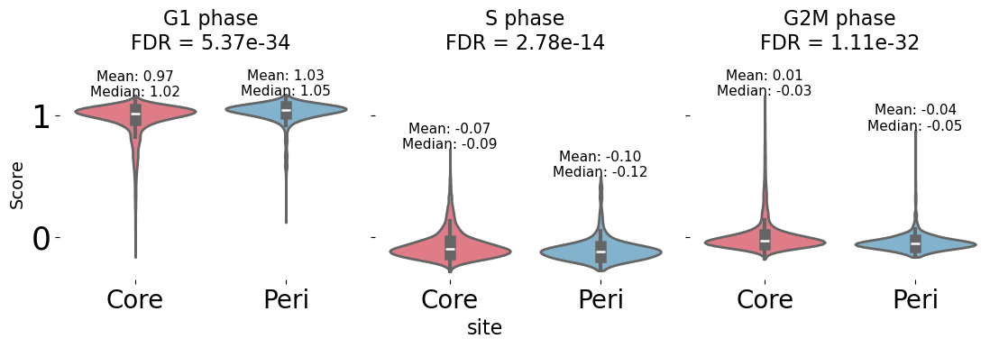

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

# ----- build long-form with G1 from S/G2M -----
df = tumor.obs[['site', 'S_score', 'G2M_score']].copy()
df['G1_score'] = 1 - df[['S_score', 'G2M_score']].max(axis=1)

long = df.melt(
    id_vars='site',
    value_vars=['G1_score', 'S_score', 'G2M_score'],
    var_name='Phase', value_name='Score'
)

phase_order  = ['G1_score', 'S_score', 'G2M_score']

phase_pretty = {'G1_score': 'G1 phase', 'S_score': 'S phase', 'G2M_score': 'G2M phase'}

site_order   = ['Core', 'Peri']
site_palette = {'Core': '#ef6c7c', 'Peri': '#77b5d9'}

# ===========================
#    1) Compute raw p-values
# ===========================
raw_pvals = []

for phase in phase_order:
    data = long[long['Phase'] == phase]
    d_core = data[data['site'] == 'Core']['Score'].dropna()
    d_peri = data[data['site'] == 'Peri']['Score'].dropna()
    stat, p = mannwhitneyu(d_core, d_peri, alternative='two-sided')
    raw_pvals.append(p)

# =========================================
#    2) Apply multiple-comparison correction
# =========================================
rej, corrected_pvals, _, _ = multipletests(raw_pvals, method='fdr_bh')

# pack into dict for easy access
phase_to_corr_p = dict(zip(phase_order, corrected_pvals))
phase_to_signif = dict(zip(phase_order, rej))

# ===========================
#    3) Plot
# ===========================
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

for i, phase in enumerate(phase_order):
    ax = axes[i]
    data = long[long['Phase'] == phase]

    sns.violinplot(
        data=data, x='site', y='Score',
        order=site_order,
        palette=[site_palette[s] for s in site_order],
        inner='box', linewidth=2, cut=0, scale='width',
        ax=ax
    )

    # ---- means/medians ----
    for j, s in enumerate(site_order):
        vals = data.loc[data['site'] == s, 'Score']
        ax.text(j, vals.max(), f"Mean: {vals.mean():.2f}\nMedian: {vals.median():.2f}",
                ha='center', fontsize=11)

    # ---- corrected p-value ----
    corr_p = phase_to_corr_p[phase]
    signif = phase_to_signif[phase]

    sig_label = "Significant" if signif else "Not significant"

    ax.set_title(
    f"{phase_pretty[phase]}\nFDR = {corr_p:.2e}",
    fontsize=16,
    pad=30,
    loc='center'
)

    # labels / cosmetics
    ax.set_xlabel("")
    if i == 0:
        ax.set_ylabel("Score", fontsize=18)
    else:
        ax.set_ylabel("")

# Increase Core and Peri label size
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=25)



    ax.set_xlabel("")
    if i == 0:
        ax.set_ylabel("Score", fontsize=14)
    else:
        ax.set_ylabel("")
    for s in ax.spines.values():
        s.set_visible(False)

fig.text(0.5, 0.02, "site", ha="center", fontsize=16)
plt.tight_layout(rect=[0.02, 0.04, 0.98, 0.96])
plt.show()


In [ ]:
phase_palette = {
    'S_score': '#298c8c',     # Teal
    'G2M_score': '#a00000',   # Red
    'G1_score': '#b8b8b8'     # Gray
}


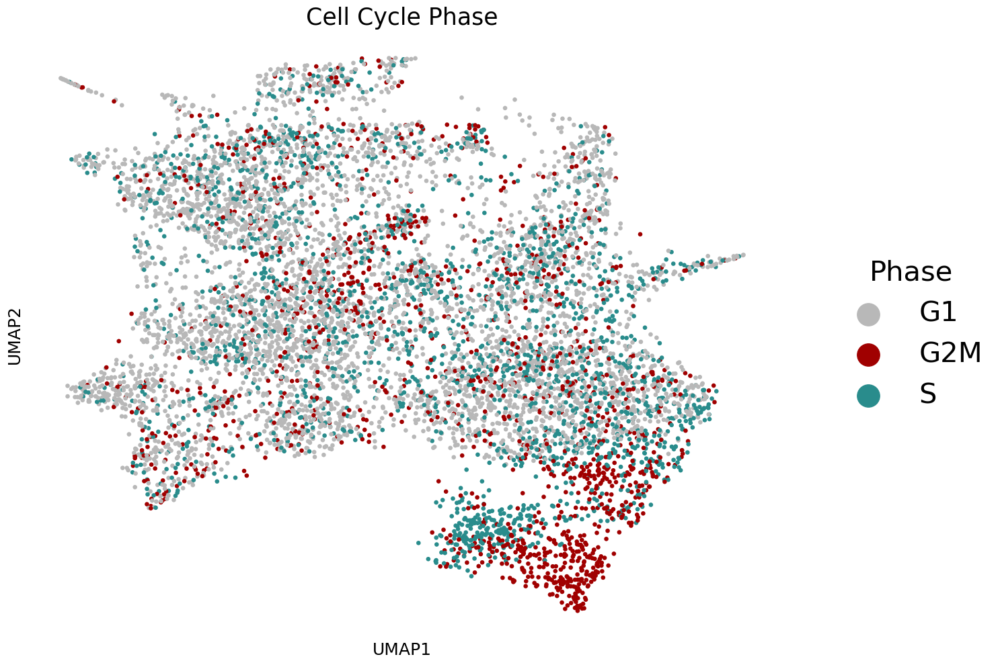

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'phase' is categorical
tumor.obs["phase"] = tumor.obs["phase"].astype("category")

# Define custom colors
phase_palette = {
    'S': '#298c8c',     # Teal
    'G2M': '#a00000',   # Red
    'G1': '#b8b8b8'     # Gray
}

# Apply the colors in the correct order
tumor.uns["phase_colors"] = [phase_palette[cat] for cat in tumor.obs["phase"].cat.categories]

# Plot and capture the figure
fig = sc.pl.umap(
    tumor,
    color='phase',
    size=90,
    frameon=True,
    return_fig=True,
    legend_loc='right margin'
)

# Resize the figure
fig.set_size_inches(15, 10)

# Access the Axes object
ax = fig.axes[0]

# Set axis labels and title
ax.set_xlabel("UMAP1", fontsize=18)
ax.set_ylabel("UMAP2", fontsize=18)
ax.set_title("Cell Cycle Phase", fontsize=25)

# Remove spines
for spine in ax.spines.values():
    spine.set_visible(False)

# Adjust legend
legend = ax.get_legend()
if legend is not None:
    # Update label names if needed
    handles, labels = ax.get_legend_handles_labels()
    label_map = {
        "S_score": "S phase",
        "G2M_score": "G2/M phase",
        "G1_score": "G1 phase"
    }
    labels = [label_map.get(label, label) for label in labels]

    legend.remove()
    ax.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.05, 0.5),
        fontsize=30,
        title="Phase",
        title_fontsize=30,
        markerscale=4,
        frameon=False
    )

plt.tight_layout()
plt.show()


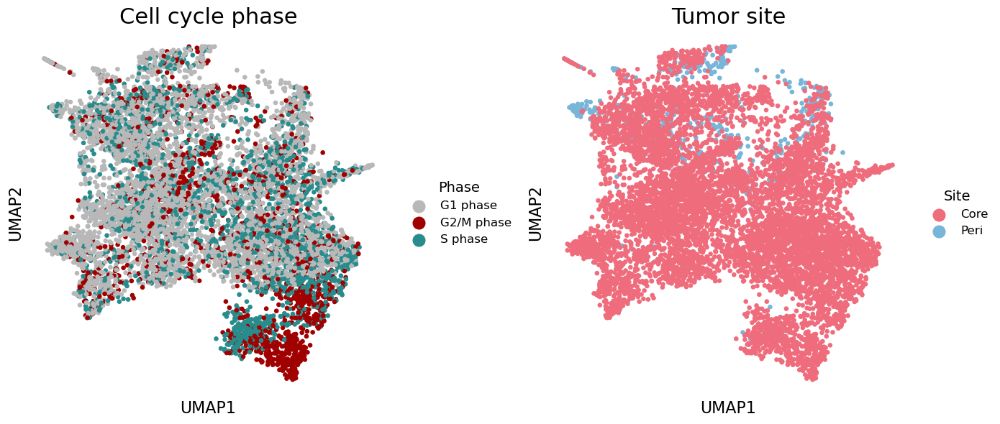

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd

# --- categories & colors ---
tumor.obs["phase"] = tumor.obs["phase"].astype("category")
tumor.obs["site"]  = tumor.obs["site"].astype("category")

phase_palette = {
    'S':   '#298c8c',   # Teal
    'G2M': '#a00000',   # Red
    'G1':  '#b8b8b8'    # Gray
}
site_palette = {
    'Core': '#ef6c7c',
    'Peri': '#77b5d9'
}

tumor.uns["phase_colors"] = [phase_palette[c] for c in tumor.obs["phase"].cat.categories]
tumor.uns["site_colors"]  = [site_palette[c]  for c in tumor.obs["site"].cat.categories]

# --- make 2-panel figure ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ========== LEFT: phase ==========
sc.pl.umap(
    tumor,
    color='phase',
    size=90,
    frameon=True,
    ax=axes[0],
    show=False,
    legend_loc='right margin'
)

ax0 = axes[0]
ax0.set_xlabel("UMAP1", fontsize=16)
ax0.set_ylabel("UMAP2", fontsize=16)
ax0.set_title("Cell cycle phase", fontsize=22)

for spine in ax0.spines.values():
    spine.set_visible(False)

# legend: rename S/G2M/G1 nicely
leg0 = ax0.get_legend()
if leg0 is not None:
    handles, labels = ax0.get_legend_handles_labels()
    label_map = {'S': 'S phase', 'G2M': 'G2/M phase', 'G1': 'G1 phase'}
    labels = [label_map.get(l, l) for l in labels]

    leg0.remove()
    ax0.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.02, 0.5),
        fontsize=12,
        title="Phase",
        title_fontsize=14,
        markerscale=2,
        frameon=False
    )

# ========== RIGHT: site ==========
sc.pl.umap(
    tumor,
    color='site',
    size=90,
    frameon=True,
    ax=axes[1],
    show=False,
    legend_loc='right margin'
)

ax1 = axes[1]
ax1.set_xlabel("UMAP1", fontsize=16)
ax1.set_ylabel("UMAP2", fontsize=16)
ax1.set_title("Tumor site", fontsize=22)

for spine in ax1.spines.values():
    spine.set_visible(False)

leg1 = ax1.get_legend()
if leg1 is not None:
    handles, labels = ax1.get_legend_handles_labels()
    leg1.remove()
    ax1.legend(
        handles,
        labels,
        loc='center left',
        bbox_to_anchor=(1.02, 0.5),
        fontsize=12,
        title="Site",
        title_fontsize=14,
        markerscale=2,
        frameon=False
    )

plt.tight_layout()
plt.show()


In [ ]:
tumor = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

In [ ]:
tumor.write("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

In [ ]:
## check gene expresseion of specific gegnes

In [ ]:
tumor = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_row_FINAL_afteratac8121.h5ad")

In [ ]:
sc.pp.normalize_total(tumor, target_sum=1e4)
sc.pp.log1p(tumor)

In [ ]:
nes = tumor

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
import numpy as np

# Create DataFrame
violin_data = pd.DataFrame({
    "NES Expression": tumor[:, "PTPRZ1"].X.toarray().flatten(),
    "Site": tumor.obs["site"]
})

# ---- MWU: Core vs Peri ----
d_core = violin_data.loc[violin_data["Site"] == "Core", "NES Expression"].dropna()
d_peri = violin_data.loc[violin_data["Site"] == "Peri", "NES Expression"].dropna()

if len(d_core) and len(d_peri):
    stat, p_val = mannwhitneyu(d_core, d_peri, alternative='two-sided')
    ptxt = f"M.W.U p={p_val:.1e}"
else:
    ptxt = "M.W.U p=NA"

# Plot
fig, ax = plt.subplots(figsize=(6, 5))
sns.violinplot(
    x="Site",
    y="NES Expression",
    data=violin_data,
    palette=["#003a7d", "#ff9d3a"],
    ax=ax
)

# Add mean/median text
for i, group in enumerate(["Core", "Peri"]):
    group_data = violin_data.loc[violin_data["Site"] == group, "NES Expression"]
    mean_val = group_data.mean()
    median_val = group_data.median()
    label_y = np.percentile(group_data, 85)
    ax.text(i, label_y, f"Mean: {mean_val:.2f}\nMed: {median_val:.2f}",
            ha='center', va='bottom', fontsize=14, fontweight='bold', color='black')

# P-value annotation
y_max = violin_data["NES Expression"].max()
ax.text(0.5, y_max + 0.5, ptxt,
        ha='center', va='bottom', fontsize=12, fontweight='bold')

# Title
fig.suptitle("       PTPRZ1 Expression", fontsize=18, fontweight='bold', y=0.9, x=0.5)

# Axis labels
ax.set_xlabel("Site", fontsize=20)
ax.set_ylabel("log₁p(PTPRZ1 Expression)", fontsize=16)

# Rename and enlarge x-axis labels
ax.set_xticklabels(
    ["Core tumor cells", "Perimarginal tumor cells"],
    fontsize=14, fontweight='bold'
)

# Clean look
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout(rect=[0, 0.01, 1, 0.95])
plt.show()



In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import numpy as np

# Create DataFrame from AnnData
violin_data = pd.DataFrame({
    "PTPRZ1 Expression": tumor[:, "PTPRZ1"].X.toarray().flatten(),
    "Site": tumor.obs["site"],
    "Patient": tumor.obs["patient"]
})

# Define desired patient order
ordered_patients = ["BTROHT01", "BTROHT02", "BTROHT03", "BTROHT04", "BTROHT05", "BTROHT06"]
patients = [p for p in ordered_patients if p in violin_data["Patient"].unique()]

# Create subplots
n_patients = len(patients)
fig, axes = plt.subplots(1, n_patients, figsize=(5 * n_patients, 6), sharey=True)

if n_patients == 1:
    axes = [axes]

for i, patient in enumerate(patients):
    ax = axes[i]

    # Subset data
    data = violin_data[violin_data["Patient"] == patient]
    core = data[data["Site"] == "Core"]["PTPRZ1 Expression"]
    peri = data[data["Site"] == "Peri"]["PTPRZ1 Expression"]

    # T-test
    if len(core) > 0 and len(peri) > 0:
        t_stat, p_val = ttest_ind(core, peri, equal_var=False)
    else:
        p_val = np.nan

    # Plot
    sns.violinplot(
        x="Site",
        y="PTPRZ1 Expression",
        data=data,
        palette=["#003a7d", "#ff9d3a"],
        ax=ax
    )

    # Mean and median labels
    for j, site in enumerate(["Core", "Peri"]):
        group_data = data[data["Site"] == site]["PTPRZ1 Expression"]
        if len(group_data) > 0:
            mean_val = group_data.mean()
            median_val = group_data.median()
            label_y = np.percentile(group_data, 85)
            ax.text(j, label_y, f"Mean: {mean_val:.2f}\nMed: {median_val:.2f}",
                    ha='center', va='bottom', fontsize=14, fontweight='bold')

    # P-value annotation
    y_max = data["PTPRZ1 Expression"].max()
    ax.text(0.5, y_max + 0.5, f"p = {p_val:.2e}" if not np.isnan(p_val) else "n/a",
            ha='center', va='bottom', fontsize=18, fontweight='bold')

    ax.set_title(f"{patient}", fontsize=18, fontweight='bold')
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=30)
    ax.set_xlabel("Site", fontsize=18)
    if i == 0:
        ax.set_ylabel("log₁p(PTPRZ1 Expression)", fontsize=22)
    else:
        ax.set_ylabel("")

    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout()
plt.show()


# Check the signatures

In [ ]:
tumor =  sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

In [ ]:
gene_list_AC = [
    "AC", "CST3", "S100B", "SLC1A3", "HEPN1", "HOPX", "MT3", "SPARCL1",
    "MLC1", "GFAP", "FABP7", "BCAN", "PON2", "METTL7B", "SPARC", "GATM",
    "RAMP1", "PMP2", "AQP4", "DBI", "EDNRB", "PTPRZ1", "CLU", "PMP22",
    "ATP1A2", "S100A16", "HEY1", "PCDHGC3", "TTYH1", "NDRG2", "PRCP",
    "ATP1B2", "AGT", "PLTP", "GPM6B", "F3", "RAB31", "PPAP2B", "ANXA5", "TSPAN7"
]


In [ ]:
#Mes like
gene_list_mes = [
 "HILPDA", "CHI3L1", "ADM", "ANXA2", "DDIT3", "ANXA1",
    "NDRG1", "CD44", "HERPUD1", "VIM", "DNAJB9", "MT2A", "TRIB3", "C1S",
    "ENO2", "NAMPT", "AKAP12", "EFEMP1", "SQSTM1", "C1R", "MT1X", "SOD2",
    "ATF3", "IFITM3", "NAMPT", "TIMP1", "NRN1", "SPP1", "SLC2A1", "A2M",
    "BNIP3", "S100A11", "LGALS3", "MT1X", "INSIG2", "S100A10", "IGFBP3", "FN1",
    "PPP1R15A", "LGALS1", "VIM", "S100A16", "PLOD2", "CLIC1", "GBE1", "MGST1",
    "SLC2A3", "RCAN1", "FTL", "TAGLN2", "WARS", "NPC2", "ERO1L", "SERPING1",
    "XPOT", "C8orf4", "HSPA5", "EMP1", "GDF15", "APOE", "ANXA2", "CTSB",
    "EPAS1", "C3", "LDHA", "LGALS3", "P4HA1", "MT1E", "SERTAD1", "EMP3",
    "PFKP", "SERPINA3", "PGK1", "ACTN1", "EGLN3", "PRDX6", "SLC6A6", "IGFBP7",
    "CA9", "SERPINE1", "BNIP3L", "PLP2", "RPL21", "MGP", "TRAM1", "CLIC4",
    "UFM1", "GFPT2", "ASNS", "GSN", "GOLT1B", "NNMT", "ANGPTL4", "TUBA1C",
    "SLC39A14", "GJA1", "CDKN1A", "TNFRSF1A", "HSPA9", "WWTR1"
]


In [ ]:
gene_list_OPC = [
   "BCAN", "PLP1", "GPR17", "FIBIN", "LHFPL3", "OLIG1", "PSAT1", "SCRG1",
    "OMG", "APOD", "SIRT2", "TNR", "THY1", "PHYHIPL", "SOX2-OT", "NKAIN4", "LPPR1",
    "PTPRZ1", "VCAN", "DBI", "PMP2", "CNP", "TNS3", "LIMA1", "CA10", "PCDHGC3",
    "CNTN1", "SCD5", "P2RX7", "CADM2", "TTYH1", "FGF12", "TMEM206", "NEU4", "FXYD6",
    "RNF13", "RTKN", "GPM6B", "LMF1", "ALCAM", "PGRMC1", "HRASLS", "BCAS1", "RAB31",
    "PLLP", "FABP5", "NLGN3", "SERINC5", "EPB41L2", "GPR37L1"
]


In [ ]:
gene_list_NPC = [
    "DLL3", "STMN2", "DLL1", "CD24", "SOX4", "RND3", "TUBB3", "HMP19",
    "HES6", "TUBB3", "TAGLN3", "MIAT", "NEU4", "DCX", "MARCKSL1", "NSG1", "CD24", "ELAVL4",
    "STMN1", "MLLT11", "TCF12", "DLX6-AS1", "BEX1", "SOX11", "OLIG1", "NREP", "MAP2", "FNBP1L",
    "FXYD6", "TAGLN3", "PTPRS", "STMN4", "MLLT11", "DLX5", "NPPA", "SOX4", "BCAN", "MAP1B",
    "MEST", "RBFOX2", "ASCL1", "IGFBPL1", "BTG2", "STMN1", "DCX", "HN1", "NXPH1", "TMEM161B-AS1",
    "HN1", "DPYSL3", "PFN2", "3-Sep", "SCG3", "PKIA", "MYT1", "ATP1B1", "CHD7", "DYNC1I1",
    "GPR56", "CD200", "TUBA1A", "SNAP25", "PCBP4", "PAK3", "ETV1", "NDRG4", "SHD", "KIF5A",
    "TNR", "UCHL1", "AMOTL2", "ENO2", "DBN1", "KIF5C", "HIP1", "DDAH2", "ABAT", "TUBB2A",
    "ELAVL4", "LBH", "LMF1", "LOC150568", "GRIK2", "TCF4", "SERINC5", "GNG3", "TSPAN13", "NFIB",
    "ELMO1", "DPYSL5", "GLCCI1", "CRABP1", "SEZ6L", "DBN1", "LRRN1", "NFIX", "SEZ6", "CEP170",
    "SOX11", "BLCAP"
]

In [ ]:
sc.tl.score_genes(tumor , gene_list_mes , score_name='Mes like' )

In [ ]:
sc.tl.score_genes(tumor , gene_list_AC , score_name='AC like' )

In [ ]:
sc.tl.score_genes(tumor , gene_list_OPC , score_name='OPC like' )

In [ ]:
sc.tl.score_genes(tumor , gene_list_NPC , score_name='NPC like' )

/tmp/ipykernel_1170668/2056146878.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1170668/2056146878.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = tumor.obs.groupby("site")[score].mean().round(2)
/tmp/ipykernel_1170668/2056146878.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = tumor.obs.groupby("site")[score].max().round(2)
/tmp/ipykernel_1170668/2056146878.py:20: FutureWarning: 

Passing `palette` without assi

Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:6.267e-01 U_stat=2.122e+06


/tmp/ipykernel_1170668/2056146878.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = tumor.obs.groupby("site")[score].mean().round(2)
/tmp/ipykernel_1170668/2056146878.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = tumor.obs.groupby("site")[score].max().round(2)
/tmp/ipykernel_1170668/2056146878.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1170668/2056146878.py:35: FutureWarning: The default of observed=False is

Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.154e-25 U_stat=1.541e+06
Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.278e-52 U_stat=1.283e+06


/tmp/ipykernel_1170668/2056146878.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = tumor.obs.groupby("site")[score].mean().round(2)
/tmp/ipykernel_1170668/2056146878.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = tumor.obs.groupby("site")[score].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:8.813e-01 U_stat=2.088e+06


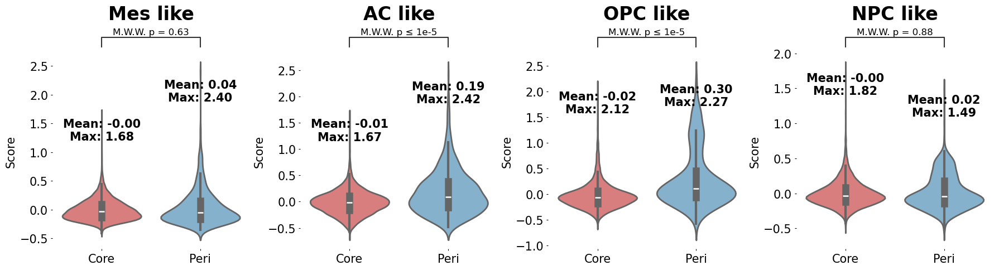

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statannotations.Annotator import Annotator

# امتیازهایی که باید نمایش داده شوند
score_cols = ['Mes like', 'AC like', 'OPC like', 'NPC like']

# ساخت Subplot ها
fig, axes = plt.subplots(1,4, figsize=(18, 5))
axes = axes.flatten()

# رنگ‌ها برای Core و Peri
palette = {"Core": "#e76f6f", "Peri": "#79b4d9"}

for i, score in enumerate(score_cols):
    ax = axes[i]

    # رسم Violin Plot
    sns.violinplot(
        data=tumor.obs,
        x='site',
        y=score,
        palette=palette,
        ax=ax,
        linewidth=2
    )

    # آماره برای p-value
    core = tumor.obs[tumor.obs['site'] == 'Core'][score].dropna()
    peri = tumor.obs[tumor.obs['site'] == 'Peri'][score].dropna()
    stat, pval = stats.mannwhitneyu(core, peri, alternative='two-sided')

    # نوشتن میانگین و بیشینه
    means = tumor.obs.groupby("site")[score].mean().round(2)
    maxs = tumor.obs.groupby("site")[score].max().round(2)
    for j, site in enumerate(["Core", "Peri"]):
        y_max = tumor.obs[tumor.obs["site"] == site][score].max()
        ax.text(j, y_max * 0.95, f"Mean: {means[site]:.2f}\nMax: {maxs[site]:.2f}",
                ha='center', va='top', fontsize=15, weight='bold')

    # نمایش عنوان در بالای نمودار با فاصله
    ax.text(0.5, 1.15, f"{score}", fontsize=24,
            ha='center', va='bottom', transform=ax.transAxes,weight='bold')

    # رسم p-value با Annotator
    pairs = [("Core", "Peri")]
    annotator = Annotator(ax, pairs, data=tumor.obs, x="site", y=score, order=["Core", "Peri"])
    annotator.configure(
        test='Mann-Whitney',
        text_format='simple',
        loc='outside',
        line_height=0.05,
        fontsize=12
    )
    annotator.apply_and_annotate()

    # برچسب‌های محورها
    ax.set_xlabel("", fontsize=1)
    ax.set_ylabel("Score", fontsize=15)
    # تنظیمات ظاهری subplot

    ax.tick_params(length=2, labelsize=15) # تغییراا سایز عدد ها و کور پری

    # حذف قاب‌ها
    for spine in ax.spines.values():
        spine.set_visible(False)

# تنظیم نهایی چیدمان
plt.tight_layout(h_pad=0.5, w_pad=0.5)
plt.show()



In [ ]:
import pandas as pd

# Replace 'your_file.xlsx' with the path to your Excel file
df = pd.read_excel('/home/fatemeh.nasrabadi/ROVIGO_congas/final/GBM_markers.xlsx', engine='openpyxl')

# Show the first few rows
print(df.tail())


          GPM  log2(fold change)   p-value       FDR  MTC  \
2140  SLC35C1           0.301892  0.003790  0.013534  NaN   
2141    HMGCL           0.301721  0.014505  0.039382  NaN   
2142    CETN2           0.300850  0.008388  0.025476  NaN   
2143   STOML2           0.300443  0.005782  0.018957  NaN   
2144     NKAP           0.300096  0.003463  0.012631  NaN   

      log2(fold change).1  p-value.1  FDR.1  NEU  log2(fold change).2  \
2140                  NaN        NaN    NaN  NaN                  NaN   
2141                  NaN        NaN    NaN  NaN                  NaN   
2142                  NaN        NaN    NaN  NaN                  NaN   
2143                  NaN        NaN    NaN  NaN                  NaN   
2144                  NaN        NaN    NaN  NaN                  NaN   

      p-value.2  FDR.2  PPR  log2(fold change).3  p-value.3  FDR.3  
2140        NaN    NaN  NaN                  NaN        NaN    NaN  
2141        NaN    NaN  NaN                  NaN        

In [ ]:
# Drop NaNs and get unique values for each column
gpm_genes = df['GPM'].dropna().unique().tolist()
mtc_genes = df['MTC'].dropna().unique().tolist()
neu_genes = df['NEU'].dropna().unique().tolist()
ppr_genes = df['PPR'].dropna().unique().tolist()

# Now you have four separate gene lists
print("GPM genes:", gpm_genes)
print("MTC genes:", mtc_genes)
print("NEU genes:", neu_genes)
print("PPR genes:", ppr_genes)


GPM genes: ['COL3A1', 'COL1A2', 'TGFBI', 'COL6A3', 'TPBG', 'MET', 'COL1A1', 'NNMT', 'MGST1', 'DAB2', 'CTGF', 'SEMA3C', 'DKK1', 'RCAN2', 'COL13A1', 'COL12A1', 'COL21A1', 'TGM2', 'MFAP2', 'SULF1', 'STRA6', 'JPH2', 'ABCC3', 'ALPK1', 'RGS4', 'DOCK5', 'BNC2', 'ENPP5', 'POPDC3', 'COL8A1', 'CAV1', 'MXRA5', 'HGF', 'THBS1', 'GALNT6', 'MYL9', 'GCNT1', 'BGN', 'SNED1', 'MLPH', 'C3', 'IL1R1', 'ACPP', 'ISLR', 'DHRS3', 'KRT18', 'COL11A1', 'EDIL3', 'CFH', 'PRRX2', 'HMCN1', 'FLI1', 'IFITM1', 'MGP', 'HOXB6', 'COL14A1', 'SLIT3', 'ITGBL1', 'BDKRB2', 'ADAMTSL1', 'MSRB3', 'TNFSF10', 'MME', 'ITGA4', 'TPD52L1', 'CXCL14', 'TGFBR2', 'SPINT1', 'CCL2', 'HOXB5', 'GALNT5', 'ALPK2', 'VDR', 'MOXD1', 'FLRT2', 'PLA2R1', 'MAN1A1', 'LUM', 'CYP1B1', 'MYLK', 'CTSZ', 'IGF1', 'GFPT2', 'ABI3BP', 'PTGER4', 'IGFBP7', 'MSC', 'CD109', 'PLXDC2', 'ADRA1B', 'IL7R', 'KCNN4', 'TUSC3', 'RASL12', 'POSTN', 'IL32', 'EDNRA', 'A4GALT', 'OCIAD2', 'DIO2', 'FLG', 'ME1', 'MFAP5', 'IL15', 'COLEC12', 'MYOF', 'STAC', 'TCIRG1', 'DKK2', 'HOXB9', 'IL

In [ ]:

sc.tl.score_genes(tumor , gpm_genes , score_name='GPM like' )

sc.tl.score_genes(tumor , mtc_genes , score_name='MTC like' )

sc.tl.score_genes(tumor , neu_genes , score_name='NEU like' )

sc.tl.score_genes(tumor , ppr_genes, score_name='PPR like' )


                 'FAM196B',           'FAM198B',           'FAM129B',
                  'TMEM56',           'FAM129A',           'RARRES3',
                 'PLA2G16',             'TMEM2', 2019-09-06 00:00:00,
                  'C9orf3',           'C2orf71',            'FAM46A',
                  'KDELC2',             'PQLC3',          'C1orf228',
                  'FBXO18',          'C22orf46',           'C8orf59',
                  'ZCCHC6'],
      dtype='object')
       2019-09-03 00:00:00,          'C14orf37', 2019-03-06 00:00:00],
      dtype='object')


/tmp/ipykernel_1170668/350107698.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1170668/350107698.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = tumor.obs.groupby("site")[score].mean().round(2)
/tmp/ipykernel_1170668/350107698.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = tumor.obs.groupby("site")[score].max().round(2)
/tmp/ipykernel_1170668/350107698.py:20: FutureWarning: 

Passing `palette` without assignin

Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.521e-24 U_stat=1.551e+06
Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.028e-03 U_stat=1.932e+06


/tmp/ipykernel_1170668/350107698.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_1170668/350107698.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = tumor.obs.groupby("site")[score].mean().round(2)
/tmp/ipykernel_1170668/350107698.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = tumor.obs.groupby("site")[score].max().round(2)
/tmp/ipykernel_1170668/350107698.py:20: FutureWarning: 

Passing `palette` without assignin

Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:5.151e-29 U_stat=1.501e+06
Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:9.948e-24 U_stat=2.631e+06


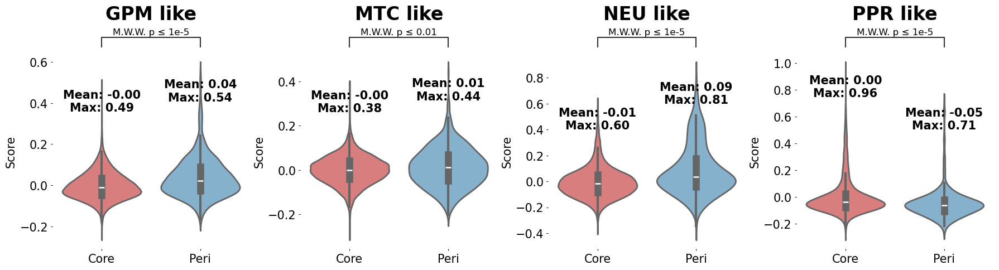

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statannotations.Annotator import Annotator

# امتیازهایی که باید نمایش داده شوند
score_cols = ['GPM like', 'MTC like', 'NEU like', 'PPR like']

# ساخت Subplot ها
fig, axes = plt.subplots(1,4, figsize=(18, 5))
axes = axes.flatten()

# رنگ‌ها برای Core و Peri
palette = {"Core": "#e76f6f", "Peri": "#79b4d9"}

for i, score in enumerate(score_cols):
    ax = axes[i]

    # رسم Violin Plot
    sns.violinplot(
        data=tumor.obs,
        x='site',
        y=score,
        palette=palette,
        ax=ax,
        linewidth=2
    )

    # آماره برای p-value
    core = tumor.obs[tumor.obs['site'] == 'Core'][score].dropna()
    peri = tumor.obs[tumor.obs['site'] == 'Peri'][score].dropna()
    stat, pval = stats.mannwhitneyu(core, peri, alternative='two-sided')

    # نوشتن میانگین و بیشینه
    means = tumor.obs.groupby("site")[score].mean().round(2)
    maxs = tumor.obs.groupby("site")[score].max().round(2)
    for j, site in enumerate(["Core", "Peri"]):
        y_max = tumor.obs[tumor.obs["site"] == site][score].max()
        ax.text(j, y_max * 0.95, f"Mean: {means[site]:.2f}\nMax: {maxs[site]:.2f}",
                ha='center', va='top', fontsize=15, weight='bold')

    # نمایش عنوان در بالای نمودار با فاصله
    ax.text(0.5, 1.15, f"{score}", fontsize=24,
            ha='center', va='bottom', transform=ax.transAxes,weight='bold')

    # رسم p-value با Annotator
    pairs = [("Core", "Peri")]
    annotator = Annotator(ax, pairs, data=tumor.obs, x="site", y=score, order=["Core", "Peri"])
    annotator.configure(
        test='Mann-Whitney',
        text_format='simple',
        loc='outside',
        line_height=0.05,
        fontsize=12
    )
    annotator.apply_and_annotate()

    # برچسب‌های محورها
    ax.set_xlabel("", fontsize=1)
    ax.set_ylabel("Score", fontsize=15)
    # تنظیمات ظاهری subplot

    ax.tick_params(length=2, labelsize=15) # تغییراا سایز عدد ها و کور پری

    # حذف قاب‌ها
    for spine in ax.spines.values():
        spine.set_visible(False)

# تنظیم نهایی چیدمان
plt.tight_layout(h_pad=0.5, w_pad=0.5)
plt.show()


# umap plot of signatures

In [ ]:
t = sc.read("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

In [ ]:
t

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source', 'leiden', 'patient_zone', 'S_score', 'G2M_score', 'phase'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'patient_colors', 'patient_zone_colors', 'pca', 'phase_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
tumor

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source', 'leiden', 'patient_zone', 'S_score', 'G2M_score', 'phase', 'Mes like', 'AC like', 'OPC like', 'NPC like', 'GPM like', 'MTC like', 'NEU like', 'PPR like'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'patient_colors', 'patient_zone_colors', 'pca', 'phase_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# Create t as a copy of tumor (or your subset if already defined)


# Add specific obs columns from tumor to t
t.obs['Mes like'] = tumor.obs['Mes like']
t.obs['AC like'] = tumor.obs['AC like']
t.obs['OPC like'] = tumor.obs['OPC like']
t.obs['NPC like'] = tumor.obs['NPC like']
t.obs['GPM like'] = tumor.obs['GPM like']
t.obs['MTC like'] = tumor.obs['MTC like']
t.obs['NEU like'] = tumor.obs['NEU like']
t.obs['PPR like'] = tumor.obs['PPR like']


In [ ]:
t

AnnData object with n_obs × n_vars = 8121 × 36601
    obs: 'site', 'patient', 'patientzone', 'source', 'leiden', 'patient_zone', 'S_score', 'G2M_score', 'phase', 'Mes like', 'AC like', 'OPC like', 'NPC like', 'GPM like', 'MTC like', 'NEU like', 'PPR like'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'patient_colors', 'patient_zone_colors', 'pca', 'phase_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
tumor = t

In [ ]:
t.write("/scratch/fatemeh.nasrabadi/importsnt/THESIS_FINAL/10Samples/FINALIZED_GEX_INTEGRATED/Tumor_Umap_harmoney8121.h5ad")

NameError: name 'vmin_values' is not defined

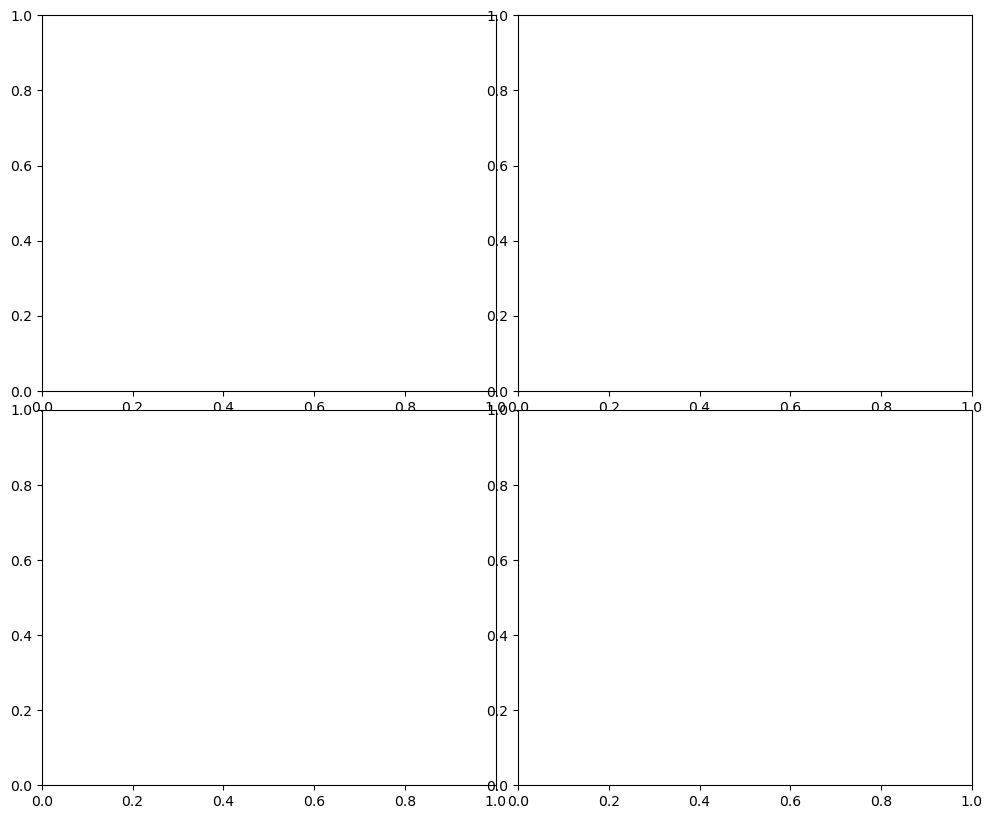

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc
from matplotlib.ticker import FuncFormatter

# مشخص‌کردن min و max برای هر feature
umap_features = ['GPM like' , 'MTC like' ,'NEU like','PPR like']


# ایجاد figure 2x2 با فاصله‌ی کم بین ساب‌پلات‌ها
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# پلات‌کردن هر feature با scale مخصوص خودش
for i, (feature, vmin, vmax) in enumerate(zip(umap_features, vmin_values, vmax_values)):
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    # رسم UMAP
    sc.pl.umap(
        tumor,
        color=feature,
        ax=ax,
        show=False,
        frameon=True,
        cmap="RdBu_r",vmax='p90'
    )

    # تنظیمات ظاهری subplot
    ax.set_title(feature, fontsize=16)
    ax.set_xlabel("UMAP1", fontsize=12)
    ax.set_ylabel("UMAP2", fontsize=12)
    ax.tick_params(length=2, labelsize=10)

    # دسترسی به colorbar و تنظیم فرمت و سایز tickها
    for im in ax.get_children():
        if hasattr(im, 'colorbar') and im.colorbar is not None:
            cbar = im.colorbar
            cbar.ax.tick_params(labelsize=10)
            cbar.ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:.3f}"))

    # حذف قاب‌های بیرونی
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout()
plt.show()


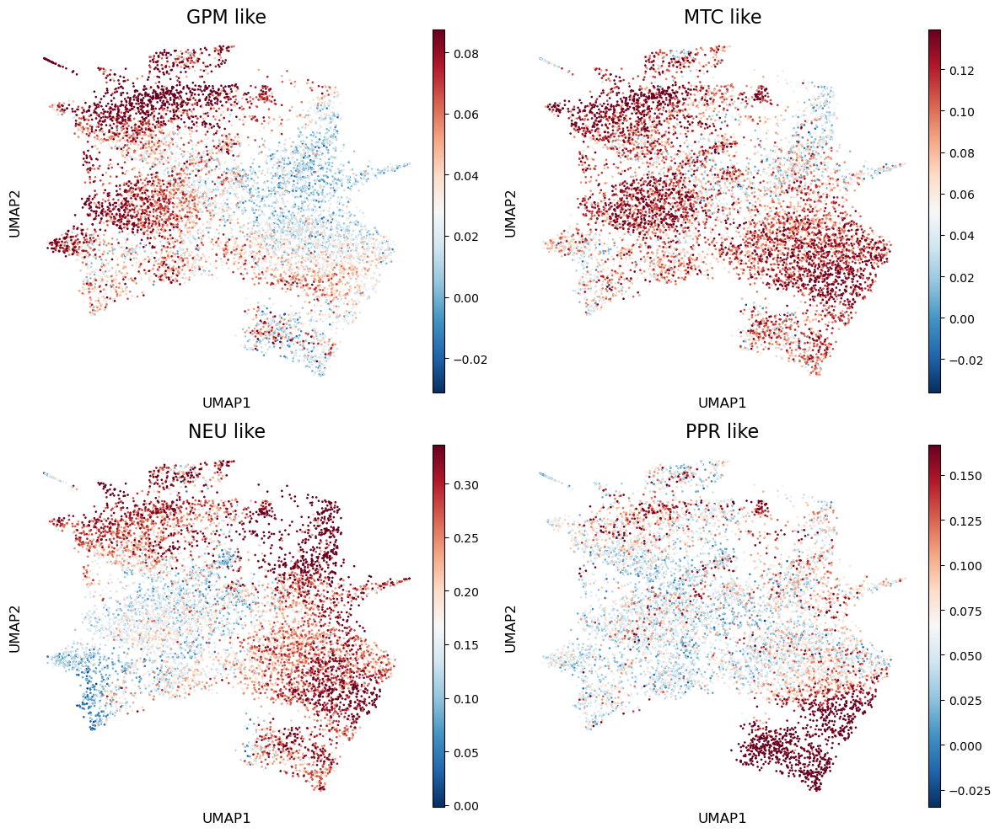

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

# Define the list of features to plot
umap_features = ['GPM like', 'MTC like', 'NEU like', 'PPR like']

# Create a 2x2 figure with minimal spacing
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# Plot each feature on its own subplot
for i, feature in enumerate(umap_features):
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    sc.pl.umap(
        tumor,
        color=feature,
        ax=ax,
        show=False,
        frameon=True,
        cmap="RdBu_r",
        vmax='p90'  # percentile-based scaling (keeps upper 10% of values)
    )

    ax.set_title(feature, fontsize=16)
    ax.set_xlabel("UMAP1", fontsize=12)
    ax.set_ylabel("UMAP2", fontsize=12)
    ax.tick_params(length=2, labelsize=10)

    # Remove outer frame
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout()
plt.show()


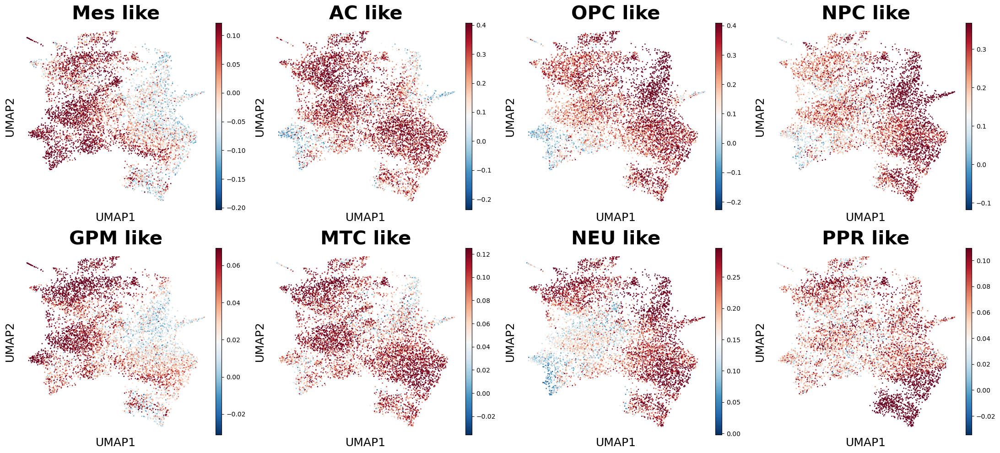

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

# === All 8 features ===
umap_features = [
    'Mes like', 'AC like', 'OPC like', 'NPC like',
    'GPM like', 'MTC like', 'NEU like', 'PPR like'
]

# === Create 2x4 figure ===
fig, axes = plt.subplots(2, 4, figsize=(22, 10))
plt.subplots_adjust(wspace=0.1, hspace=0.1)

# === Plot each feature ===
for i, feature in enumerate(umap_features):
    row = i // 4
    col = i % 4
    ax = axes[row, col]

    sc.pl.umap(
        tumor,
        color=feature,
        ax=ax,
        show=False,
        frameon=True,
        cmap="RdBu_r",
        vmax='p80'
    )

    ax.set_title(feature, fontsize=30,weight='bold')
    ax.set_xlabel("UMAP1", fontsize=18)
    ax.set_ylabel("UMAP2", fontsize=18)
    ax.tick_params(length=2, labelsize=17)

    # Remove outer frame
    for spine in ax.spines.values():
        spine.set_visible(False)

# === Tidy layout ===
plt.tight_layout()
plt.show()


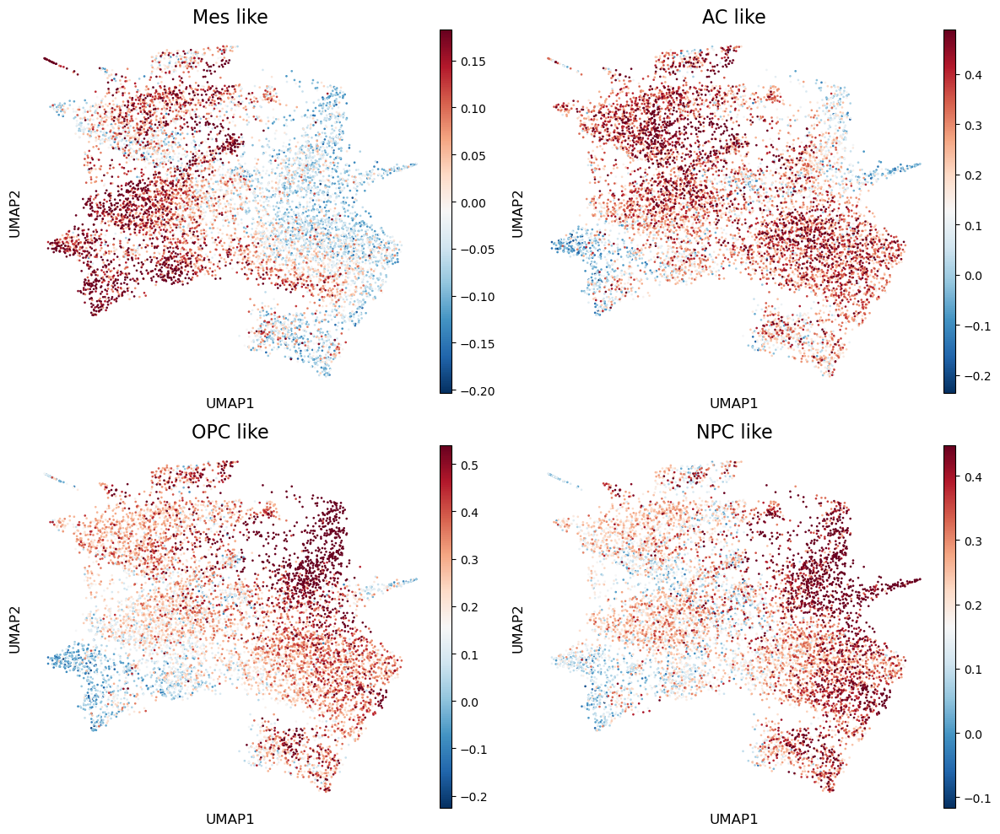

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

# Define the list of features to plot
umap_features = ['Mes like', 'AC like', 'OPC like', 'NPC like']

# Create a 2x2 figure with minimal spacing
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# Plot each feature on its own subplot
for i, feature in enumerate(umap_features):
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    sc.pl.umap(
        tumor,
        color=feature,
        ax=ax,
        show=False,
        frameon=True,
        cmap="RdBu_r",
        vmax='p90'  # percentile-based scaling (keeps upper 10% of values)
    )

    ax.set_title(feature, fontsize=16)
    ax.set_xlabel("UMAP1", fontsize=12)
    ax.set_ylabel("UMAP2", fontsize=12)
    ax.tick_params(length=2, labelsize=10)

    # Remove outer frame
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout()
plt.show()


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.866e-12 U_stat=3.551e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:4.108e-08 U_stat=1.771e+05


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.909e-04 U_stat=9.472e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.169e-02 U_stat=5.197e+03


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:9.309e-10 U_stat=2.318e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:4.759e-06 U_stat=3.192e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.058e-34 U_stat=1.248e+05


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.668e-04 U_stat=9.357e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:9.107e-01 U_stat=3.729e+03


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.432e-01 U_stat=1.097e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.789e-31 U_stat=8.299e+03


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:8.003e-02 U_stat=2.057e+05


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.357e-05 U_stat=4.004e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:6.588e-03 U_stat=5.306e+03


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.506e-03 U_stat=7.387e+03


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.970e-23 U_stat=1.077e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.819e-07 U_stat=2.593e+05


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.861e-02 U_stat=5.488e+04


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:6.206e-03 U_stat=5.317e+03


/tmp/ipykernel_2255777/2038635370.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/2038635370.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/2038635370.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:9.499e-01 U_stat=1.272e+04


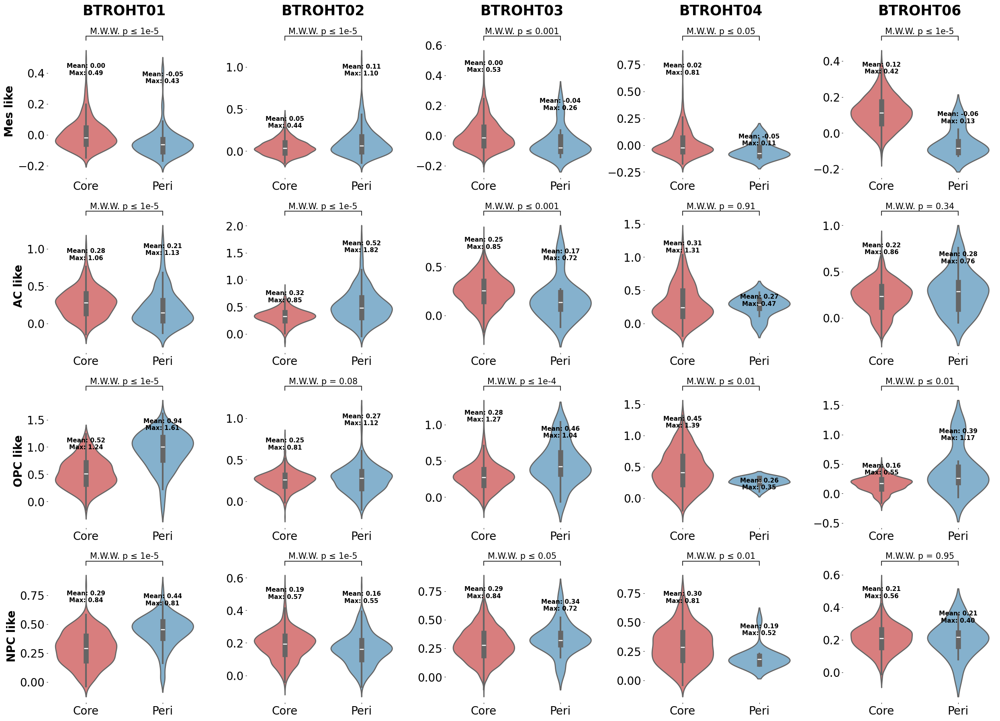

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statannotations.Annotator import Annotator

# Base config
palette = {"Core": "#e76f6f", "Peri": "#79b4d9"}
signatures = [
    "Mes like", "AC like", "OPC like", "NPC like",
]
patients = ["BTROHT01", "BTROHT02", "BTROHT03", "BTROHT04", "BTROHT06"]

# Create figure with 8 rows × 5 columns
nrows, ncols = len(signatures), len(patients)
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows))
axes = axes.reshape(nrows, ncols)

for row, sig in enumerate(signatures):
    for col, patient in enumerate(patients):
        ax = axes[row][col]
        data = tumor.obs[tumor.obs['patient'] == patient]

        # Violin plot
        sns.violinplot(
            data=data,
            x='site',
            y=sig,
            palette=palette,
            ax=ax,
            linewidth=2
        )

        # Statistical test
        core = data[data['site'] == 'Core'][sig].dropna()
        peri = data[data['site'] == 'Peri'][sig].dropna()
        if not core.empty and not peri.empty:
            stat, pval = stats.mannwhitneyu(core, peri, alternative='two-sided')
        else:
            pval = None

        # Mean & Max annotation
        means = data.groupby("site")[sig].mean().round(2)
        maxs = data.groupby("site")[sig].max().round(2)
        for j, site in enumerate(["Core", "Peri"]):
            if site in data['site'].values:
                y_max = data[data["site"] == site][sig].max()
                ax.text(j, y_max * 0.95, f"Mean: {means[site]:.2f}\nMax: {maxs[site]:.2f}",
                        ha='center', va='top', fontsize=11, weight='bold')

        # Patient label (top of each column)
        if row == 0:
            ax.text(0.5, 1.2, f"{patient}", fontsize=25,
                    ha='center', va='bottom', transform=ax.transAxes, weight='bold')

        # Signature label (start of each row)
        if col == 0:
            ax.set_ylabel(f"{sig}", fontsize=20, weight='bold')
        else:
            ax.set_ylabel("")

        ax.set_xlabel("")

        # Annotator
        pairs = [("Core", "Peri")]
        annotator = Annotator(ax, pairs, data=data, x="site", y=sig, order=["Core", "Peri"])
        annotator.configure(
            test='Mann-Whitney',
            text_format='simple',
            loc='outside',
            line_height=0.03,
            fontsize=15
        )
        annotator.apply_and_annotate()

        # Clean up look
        ax.tick_params(length=2, labelsize=20)
        for spine in ax.spines.values():
            spine.set_visible(False)

# Final layout
plt.tight_layout(h_pad=2.0, w_pad=1.5)
plt.show()


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.601e-05 U_stat=3.139e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:8.980e-05 U_stat=2.493e+05


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:9.484e-09 U_stat=2.966e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.303e-08 U_stat=7.140e+02


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.456e-02 U_stat=1.683e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.455e-01 U_stat=2.739e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:6.703e-07 U_stat=2.574e+05


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:1.645e-01 U_stat=5.954e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.835e-10 U_stat=3.040e+02


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.587e-01 U_stat=1.420e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:8.973e-10 U_stat=1.636e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:6.073e-12 U_stat=2.720e+05


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.159e-10 U_stat=2.587e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:6.124e-04 U_stat=1.883e+03


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:4.800e-08 U_stat=3.179e+03


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:8.400e-01 U_stat=2.498e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:5.623e-19 U_stat=2.875e+05


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.474e-04 U_stat=9.427e+04


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:3.710e-03 U_stat=2.175e+03


/tmp/ipykernel_2255777/849133844.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2255777/849133844.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = data.groupby("site")[sig].mean().round(2)
/tmp/ipykernel_2255777/849133844.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  maxs = data.groupby("site")[sig].max().round(2)


Core vs. Peri: Mann-Whitney-Wilcoxon test two-sided, P_val:2.035e-01 U_stat=1.481e+04


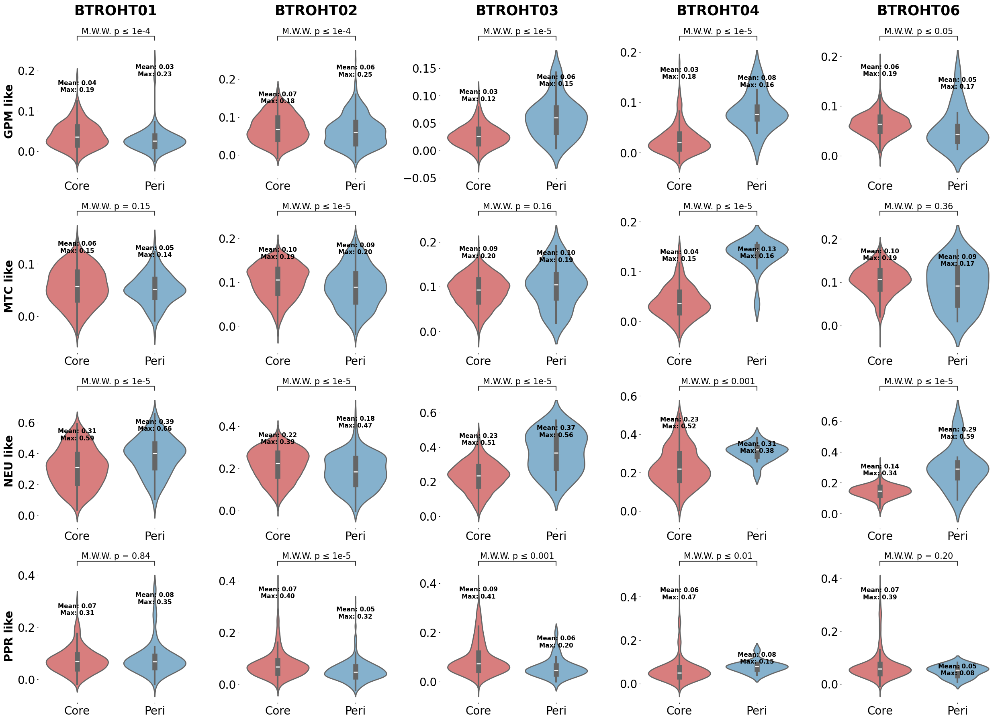

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from statannotations.Annotator import Annotator

# Base config
palette = {"Core": "#e76f6f", "Peri": "#79b4d9"}
signatures = [
      "GPM like", "MTC like", "NEU like", "PPR like"
]
patients = ["BTROHT01", "BTROHT02", "BTROHT03", "BTROHT04", "BTROHT06"]

# Create figure with 8 rows × 5 columns
nrows, ncols = len(signatures), len(patients)
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.5 * nrows))
axes = axes.reshape(nrows, ncols)

for row, sig in enumerate(signatures):
    for col, patient in enumerate(patients):
        ax = axes[row][col]
        data = tumor.obs[tumor.obs['patient'] == patient]

        # Violin plot
        sns.violinplot(
            data=data,
            x='site',
            y=sig,
            palette=palette,
            ax=ax,
            linewidth=2
        )

        # Statistical test
        core = data[data['site'] == 'Core'][sig].dropna()
        peri = data[data['site'] == 'Peri'][sig].dropna()
        if not core.empty and not peri.empty:
            stat, pval = stats.mannwhitneyu(core, peri, alternative='two-sided')
        else:
            pval = None

        # Mean & Max annotation
        means = data.groupby("site")[sig].mean().round(2)
        maxs = data.groupby("site")[sig].max().round(2)
        for j, site in enumerate(["Core", "Peri"]):
            if site in data['site'].values:
                y_max = data[data["site"] == site][sig].max()
                ax.text(j, y_max * 0.95, f"Mean: {means[site]:.2f}\nMax: {maxs[site]:.2f}",
                        ha='center', va='top', fontsize=11, weight='bold')

        # Patient label (top of each column)
        if row == 0:
            ax.text(0.5, 1.2, f"{patient}", fontsize=25,
                    ha='center', va='bottom', transform=ax.transAxes, weight='bold')

        # Signature label (start of each row)
        if col == 0:
            ax.set_ylabel(f"{sig}", fontsize=20, weight='bold')
        else:
            ax.set_ylabel("")

        ax.set_xlabel("")

        # Annotator
        pairs = [("Core", "Peri")]
        annotator = Annotator(ax, pairs, data=data, x="site", y=sig, order=["Core", "Peri"])
        annotator.configure(
            test='Mann-Whitney',
            text_format='simple',
            loc='outside',
            line_height=0.03,
            fontsize=15
        )
        annotator.apply_and_annotate()

        # Clean up look
        ax.tick_params(length=2, labelsize=20)
        for spine in ax.spines.values():
            spine.set_visible(False)

# Final layout
plt.tight_layout(h_pad=2.0, w_pad=1.5)
plt.show()
